In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import folium
from folium.plugins import HeatMap
import numpy as np

In [2]:
# TODO: load dataset from es
df = pd.read_json('sa2_health_observations.json')
gdf = pd.read_json('../data-harvest/data/All_SA2.json')

In [3]:
set(df['illness'])

{' a_oth_lthc_age_tot',
 ' arthritis_age_tot',
 ' asthma_age_tot',
 ' cancer_inc_rem_age_tot',
 ' dem_inc_alz_age_tot',
 ' dia_exc_ges_dia_age_tot',
 ' hd_inc_ha_ang_age_tot',
 ' kid_dis_age_tot',
 ' lc_inc_copd_emph_age_tot',
 ' mhc_inc_dep_anx_age_tot',
 ' no_lthc_age_tot',
 ' not_st_age_tot',
 ' stroke_age_tot'}

In [4]:
df_location = pd.merge(df, gdf,left_on=['sa2_name', 'sa2_code'], right_on=['sa2_name', 'sa2_code'], how='inner')

In [5]:
illness_map = {
    "Other Long-Term Health Conditions": " a_oth_lthc_age_tot",
    "Arthritis": " arthritis_age_tot",
    "Asthma": " asthma_age_tot",
    "Cancer (including remission)": " cancer_inc_rem_age_tot",
    "Dementia (including Alzheimer's)": " dem_inc_alz_age_tot",
    "Diabetes (excluding gestational diabetes)": " dia_exc_ges_dia_age_tot",
    "Heart Disease (including heart attack and angina)": " hd_inc_ha_ang_age_tot",
    "Kidney Disease": " kid_dis_age_tot",
    "Lung Conditions (including COPD and emphysema)": " lc_inc_copd_emph_age_tot",
    "Mental Health Conditions (including depression and anxiety)": " mhc_inc_dep_anx_age_tot",
    "No Long-Term Health Conditions": " no_lthc_age_tot",
    "Not Stated": " not_st_age_tot",
    "Stroke": " stroke_age_tot"
}

reversed_illness_map = {v: k for k, v in illness_map.items()}


In [ ]:
weekly_income_map = {
  "Nil income": " neg_nil_inc_tot",
  "Between 1 and 149": " _1_149_tot",
  "Between 150 and 299": " _150_299_tot",
  "Between 300 and 399": " _300_399_tot",
  "Between 400 and 499": " _400_499_tot",
  "Between 500 and 649": " _500_649_tot",
  "Between 650 and 799": " _650_799_tot",
  "Between 800 and 999": " _800_999_tot",
  "Between 1000 and 1249": " _1000_1249_tot",
  "Between 1250 and 1499": " _1250_1499_tot",
  "Between 1500 and 1749": " _1500_1749_tot",
  "Between 1750 and 1999": " _1750_1999_tot",
  "Between 2000 and 2499": " _2000_2499_tot",
  "Between 2500 and 2999": " _2500_2999_tot",
  "Between 3000 and 3499": " _3000_3499_tot",
  "Between 3500 and 3999": " _3500_3999_tot",
  "4000 or more": " _4000ormore_tot",
  "Partially stated income": " part_inc_stated_tot",
  "Income not stated": " all_inc_ns_tot",
  "Total households": " tot_tot"
}


In [ ]:
language_map = {
    "English": " uses_eng_on_p",
    "Afrikaans": " uses_othr_lang_afrikaans_p",
    "Arabic": " uses_othr_lang_arabic_p",
    "Australian Indigenous Languages": " uses_othr_lang_aus_ind_lang_p",
    "Chinese languages Cantonese": " uses_othr_lan_chin_lan_cant_p",
    "Chinese languages Mandarin": " uses_othr_lan_chin_lan_mand_p",
    "Chinese languages Other": " uses_othr_lan_chin_lan_oth_p",
    "Chinese languages Total": " uses_othr_lan_chin_lan_tot_p",
    "Croatian": " uses_othr_lang_croatian_p",
    "French": " uses_othr_lang_french_p",
    "German": " uses_othr_lang_german_p",
    "Greek": " uses_othr_lang_greek_p",
    "Indo Aryan Languages Bengali": " us_oth_lan_indo_ary_lan_ben_p",
    "Indo Aryan Languages Gujarati": " us_oth_lan_indo_ary_lan_guj_p",
    "Indo Aryan Languages Hindi": " us_oth_lan_indo_ary_lan_hin_p",
    "Indo Aryan Languages Nepali": " us_oth_lan_indo_ary_lan_nep_p",
    "Indo Aryan Languages Punjabi": " us_oth_lan_ind_ary_lan_punj_p",
    "Indo Aryan Languages Sinhalese": " us_oth_lan_ind_ary_lan_sinh_p",
    "Indo Aryan Languages Urdu": " us_oth_lan_indo_ary_lan_urd_p",
    "Indo Aryan Languages Other": " us_oth_lan_indo_ary_lan_oth_p",
    "Indo Aryan Languages Total": " us_oth_lan_indo_ary_lan_tot_p",
    "Italian": " uses_othr_lang_italian_p",
    "Japanese": " uses_othr_lang_japanese_p",
    "Khmer": " uses_othr_lang_khmer_p",
    "Korean": " uses_othr_lang_korean_p",
    "Macedonian": " uses_othr_lang_macedonian_p",
    "Malayalam": " uses_othr_lang_malayalam_p",
    "Persian excluding Dari": " us_oth_lan_persian_ex_dari_p",
    "Polish": " uses_othr_lang_polish_p",
    "Portuguese": " uses_othr_lang_portugese_p",
    "Russian": " uses_othr_lang_russian_p",
    "Samoan": " uses_othr_lang_samoan_p",
    "Serbian": " uses_othr_lang_serbian_p",
    "Southeast Asian Austronesian Languages Filipino": " us_oth_la_se_as_au_la_fili_p",
    "Southeast Asian Austronesian Languages Indonesian": " us_oth_la_se_as_au_la_indo_p",
    "Southeast Asian Austronesian Languages Tagalog": " us_oth_la_se_as_au_la_tag_p",
    "Southeast Asian Austronesian Languages Other": " us_oth_la_se_as_au_la_oth_p",
    "Southeast Asian Austronesian Languages Total": " us_oth_la_se_as_au_la_tot_p",
    "Spanish": " uses_othr_lang_spanish_p",
    "Tamil": " uses_othr_lang_tamil_p",
    "Thai": " uses_othr_lang_thai_p",
    "Turkish": " uses_othr_lang_turkish_p",
    "Vietnamese": " uses_othr_lang_vietnamese_p",
    "Other Language": " uses_othr_lang_other_p",
    "Total Other Language Persons": " uses_othr_lang_tot_p",
    "Not stated": " lang_used_home_ns_p",
    "Overseas visitors": " os_visitors_p",
    "Total Persons": " tot_p"
}

In [ ]:
weather_map = {
    "Gust Speed (km/h)": "gust_kmh",
    "Apparent Temperature": "apparent_t",
    "Delta Temperature": "delta_t",
    "Air Temperature": "air_temp",
    "Pressure": "press",
    "Rain Trace": "rain_trace",
    "Relative Humidity": "rel_hum",
    "Visibility (km)": "vis_km",
    "Wind Speed (km/h)": "wind_spd_kmh"
}

Find for a specific illness

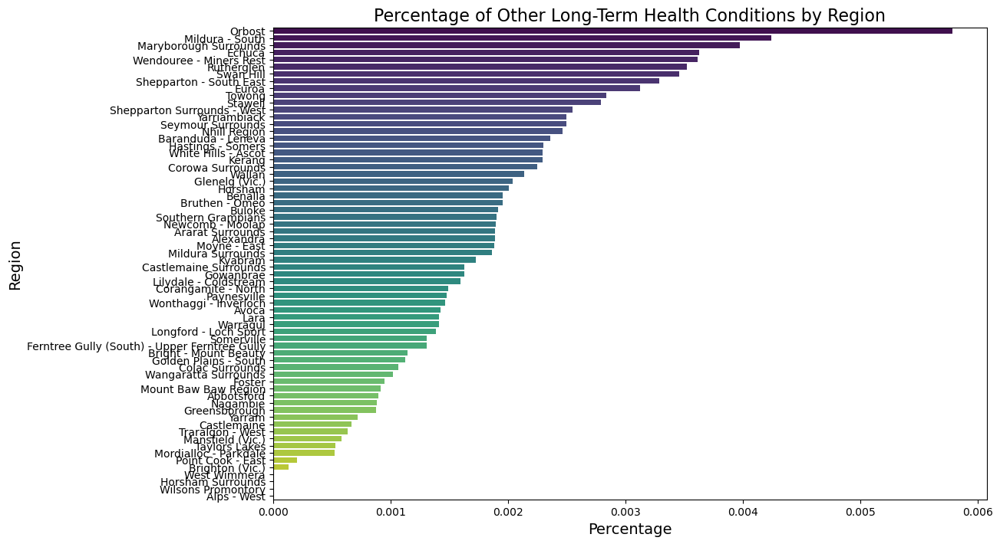

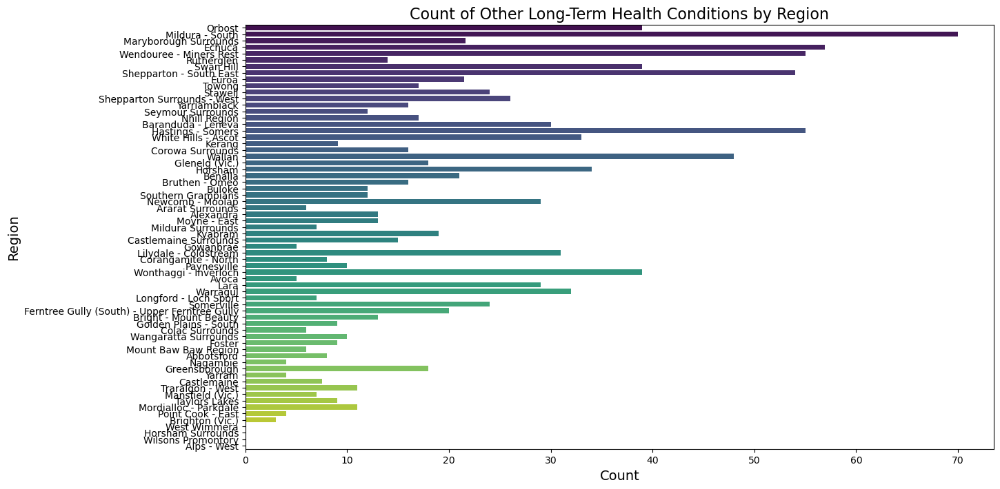

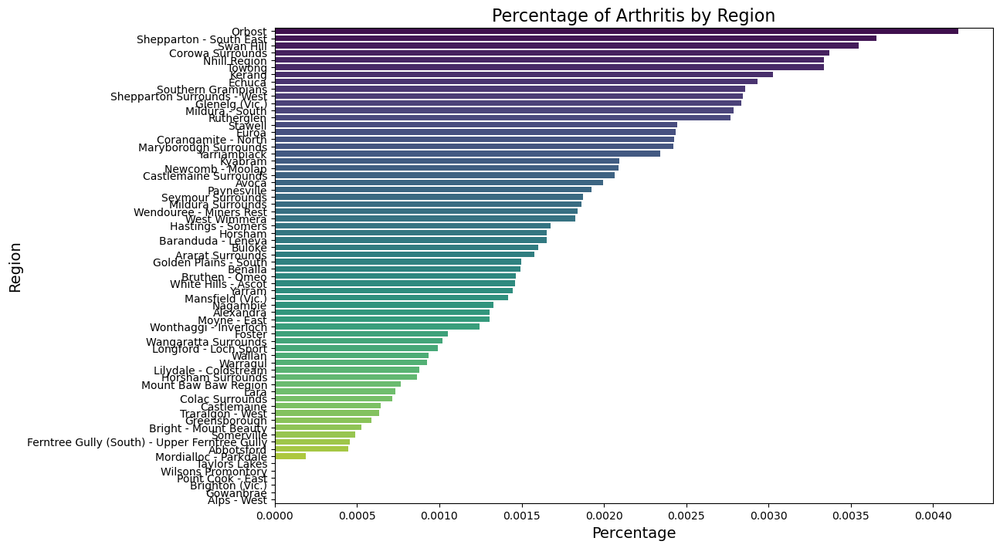

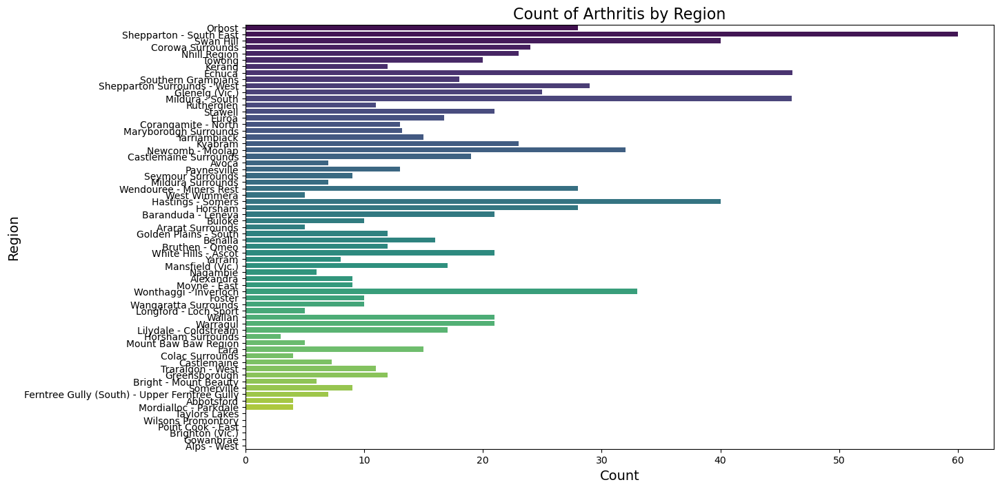

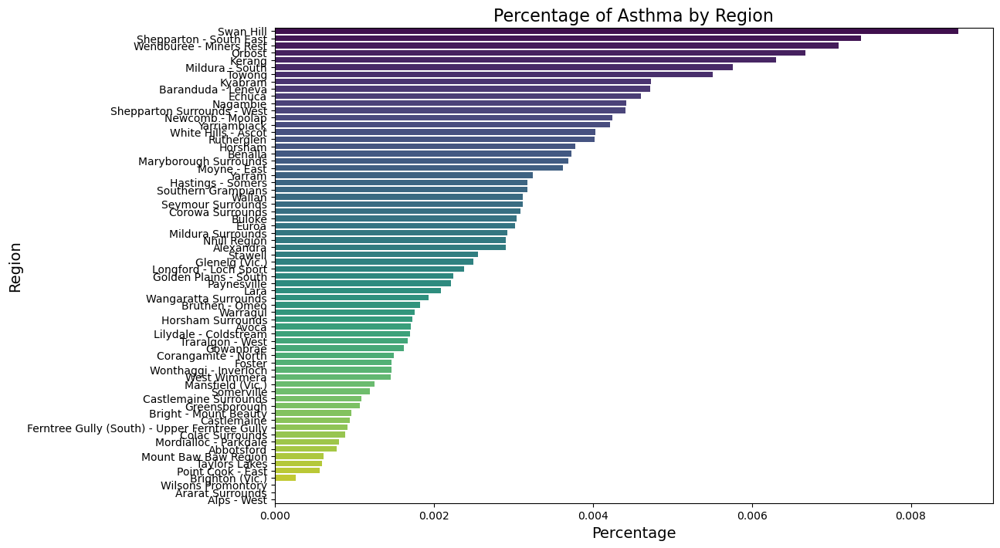

...

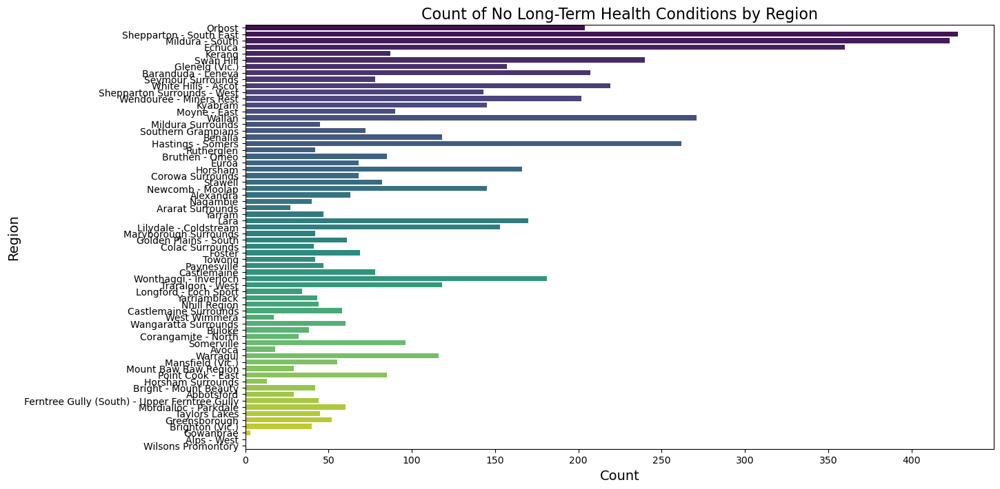

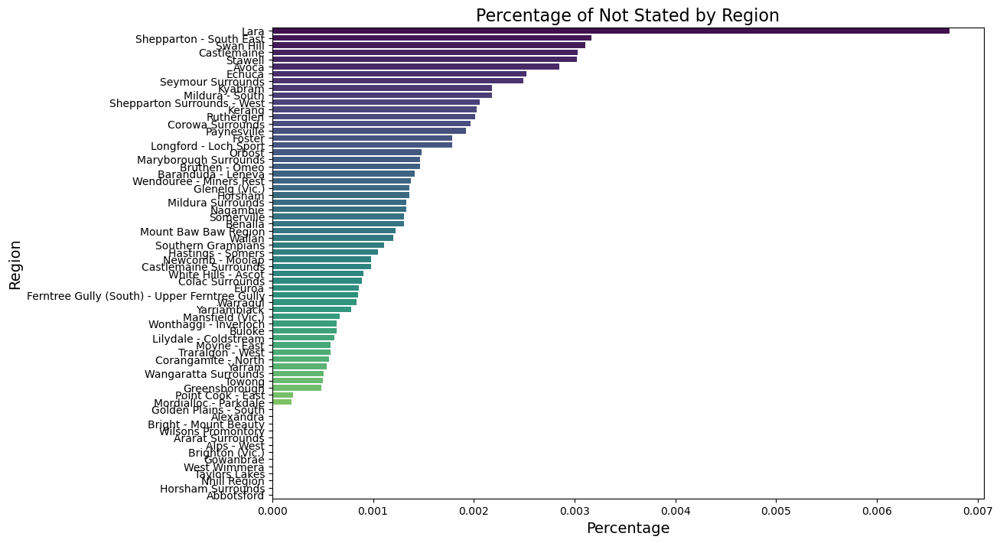

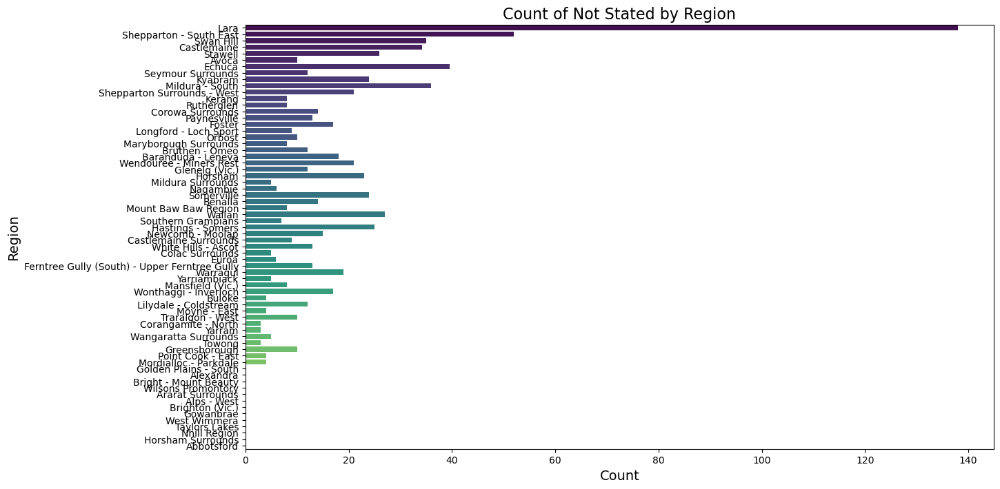

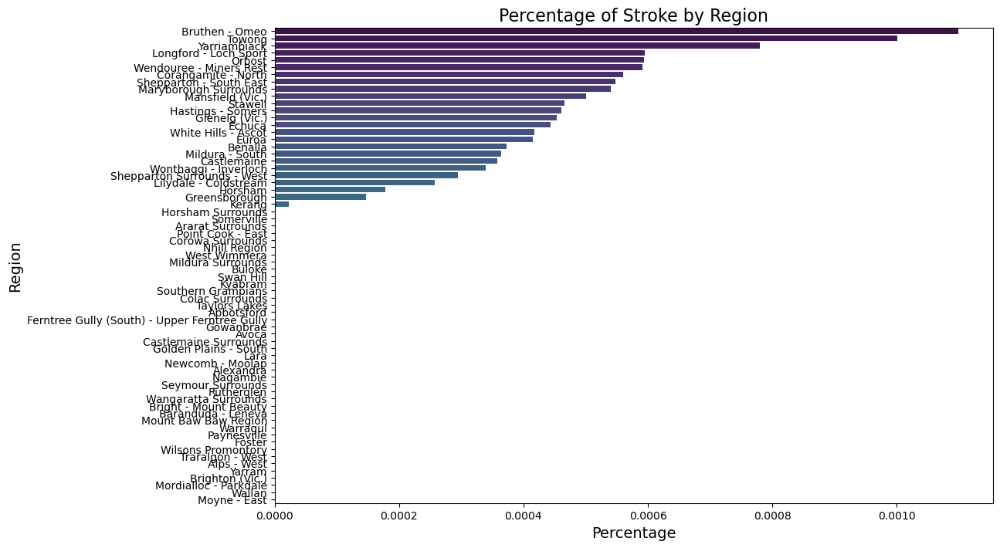

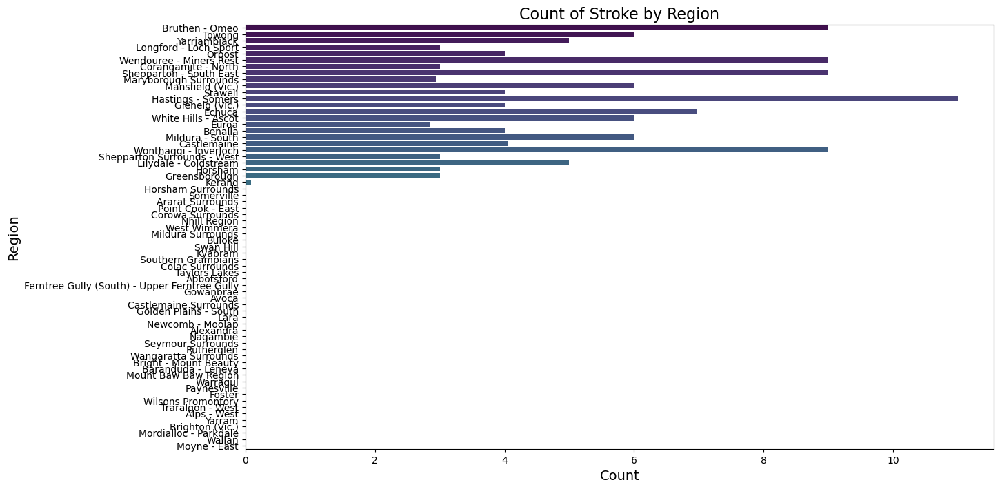

In [6]:
for illness in illness_map:
    # for each illness
    df_visual = df_location[df_location["illness"] == illness_map[illness]]
    df_visual = df_visual.sort_values(by="percentage", ascending=False)
    
    # bar plot about percentage
    plt.figure(figsize=(12, 8))
    ax = sns.barplot(x="percentage", y="sa2_name", data=df_visual, palette="viridis")
    ax.set_title(f"Percentage of {illness} by Region", fontsize=16)
    ax.set_xlabel("Percentage", fontsize=14)
    ax.set_ylabel("Region", fontsize=14)
    plt.show()
    
    # bar plot about number of people who have this illness
    plt.figure(figsize=(14, 8))
    ax = sns.barplot(x="count", y="sa2_name", data=df_visual, palette="viridis")
    ax.set_title(f"Count of {illness} by Region", fontsize=16)
    ax.set_xlabel("Count", fontsize=14)
    ax.set_ylabel("Region", fontsize=14)
    plt.show()
    
    # heatmap
    melbourne_center = [-37.8136, 144.9631]
    m = folium.Map(location=melbourne_center, zoom_start=14)
    heat_data = [[row['lat'], row['lon'], row['count']] for index, row in df_visual.iterrows()]
    HeatMap(heat_data).add_to(m)
    display(m)

    heat_data = [[row['lat'], row['lon'], row['percentage']] for index, row in df_visual.iterrows()]
    HeatMap(heat_data).add_to(m)
    display(m)

In [7]:
# for example search the illness for arthritis
search_illness = "Arthritis"

df_visual = df_location[df_location["illness"] == illness_map[search_illness]]

In [8]:
df_visual

,_id,sa2_code,sa2_name,illness,count,tot_people,percentage,lon,lat
1,arthritis_age_tot_109031181,109031181,Corowa Surrounds,arthritis_age_tot,24.0,7123,0.003369,146.281494,-35.643168
14,arthritis_age_tot_201011008,201011008,Wendouree - Miners Rest,arthritis_age_tot,28.0,15229,0.001839,143.802554,-37.497554
27,arthritis_age_tot_201031013,201031013,Avoca,arthritis_age_tot,7.0,3511,0.001994,143.374060,-37.108931
40,arthritis_age_tot_201031017,201031017,Maryborough Surrounds,arthritis_age_tot,13.2,5447,0.002423,143.707104,-36.981337
53,arthritis_age_tot_202011025,202011025,White Hills - Ascot,arthritis_age_tot,21.0,14368,0.001462,144.321758,-36.676236
...,...,...,...,...,...,...,...,...,...
794,arthritis_age_tot_217011420,217011420,Glenelg (Vic.),arthritis_age_tot,25.0,8821,0.002834,141.382862,-37.866305
807,arthritis_age_tot_217011423,217011423,Southern Grampians,arthritis_age_tot,18.0,6303,0.002856,142.028939,-37.536630
820,arthritis_age_tot_217031473,217031473,Colac Surrounds,arthritis_age_tot,4.0,5619,0.000712,143.636283,-38.298007
833,arthritis_age_tot_217031474,217031474,Corangamite - North,arthritis_age_tot,13.0,5354,0.002428,143.260489,-38.022049


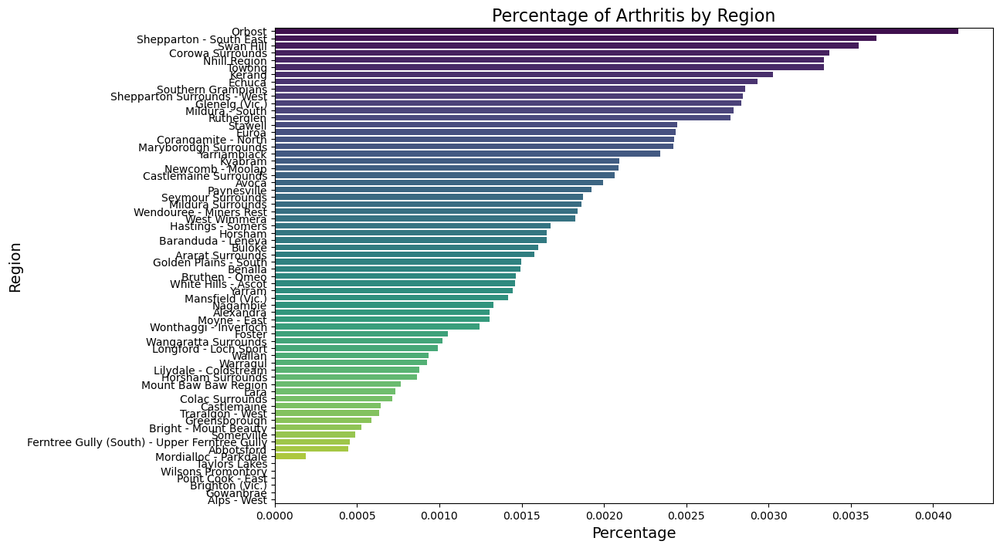

In [9]:
df_visual = df_visual.sort_values(by="percentage", ascending=False)
plt.figure(figsize=(12, 8))
ax = sns.barplot(x="percentage", y="sa2_name", data=df_visual, palette="viridis")
ax.set_title(f"Percentage of {search_illness} by Region", fontsize=16)
ax.set_xlabel("Percentage", fontsize=14)
ax.set_ylabel("Region", fontsize=14)
plt.show()

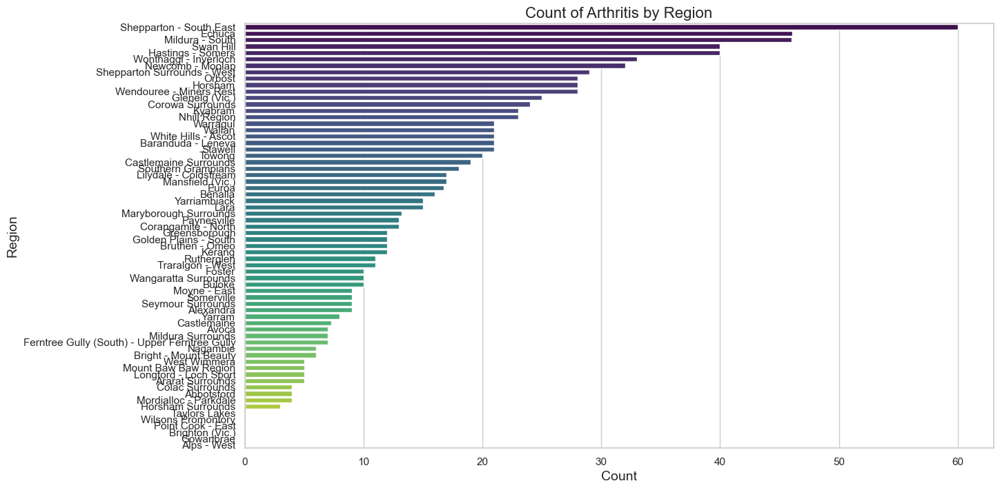

In [10]:
df_visual = df_visual.sort_values(by="count", ascending=False)
sns.set(style="whitegrid")
plt.figure(figsize=(14, 8))
ax = sns.barplot(x="count", y="sa2_name", data=df_visual, palette="viridis")
ax.set_title(f"Count of {search_illness} by Region", fontsize=16)
ax.set_xlabel("Count", fontsize=14)
ax.set_ylabel("Region", fontsize=14)

plt.show()

In [11]:
melbourne_center = [-37.8136, 144.9631]
m = folium.Map(location=melbourne_center, zoom_start=14)
heat_data = [[row['lat'], row['lon'], row['count']] for index, row in df_visual.iterrows()]
HeatMap(heat_data).add_to(m)
m

In [12]:
melbourne_center = [-37.8136, 144.9631]
m = folium.Map(location=melbourne_center, zoom_start=14)
heat_data = [[row['lat'], row['lon'], row['percentage']] for index, row in df_visual.iterrows()]
HeatMap(heat_data).add_to(m)
m

Find based on SA2

In [13]:
sa2_code = set(df['sa2_code'])
sa2_name = set(df['sa2_name'])

In [14]:
sa2_name

{'Abbotsford',
 'Alexandra',
 'Alps - West',
 'Ararat Surrounds',
 'Avoca',
 'Baranduda - Leneva',
 'Benalla',
 'Bright - Mount Beauty',
 'Brighton (Vic.)',
 'Bruthen - Omeo',
 'Buloke',
 'Castlemaine',
 'Castlemaine Surrounds',
 'Colac Surrounds',
 'Corangamite - North',
 'Corowa Surrounds',
 'Echuca',
 'Euroa',
 'Ferntree Gully (South) - Upper Ferntree Gully',
 'Foster',
 'Glenelg (Vic.)',
 'Golden Plains - South',
 'Gowanbrae',
 'Greensborough',
 'Hastings - Somers',
 'Horsham',
 'Horsham Surrounds',
 'Kerang',
 'Kyabram',
 'Lara',
 'Lilydale - Coldstream',
 'Longford - Loch Sport',
 'Mansfield (Vic.)',
 'Maryborough Surrounds',
 'Mildura - South',
 'Mildura Surrounds',
 'Mordialloc - Parkdale',
 'Mount Baw Baw Region',
 'Moyne - East',
 'Nagambie',
 'Newcomb - Moolap',
 'Nhill Region',
 'Orbost',
 'Paynesville',
 'Point Cook - East',
 'Rutherglen',
 'Seymour Surrounds',
 'Shepparton - South East',
 'Shepparton Surrounds - West',
 'Somerville',
 'Southern Grampians',
 'Stawell',
 'S

In [15]:
search_area = 'Abbotsford'
df_sa2 = df[df['sa2_name'] == search_area]

df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/2420078620.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


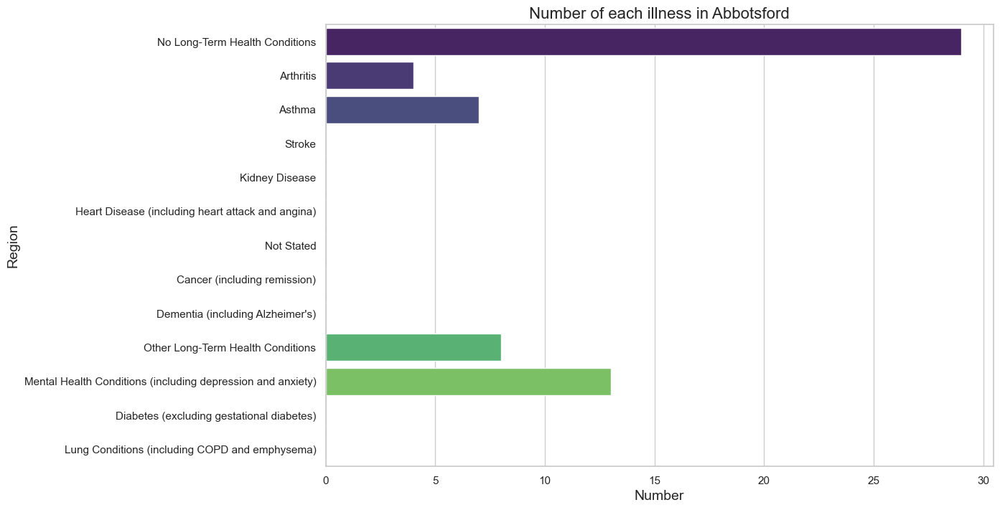

In [17]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(x="count", y="illness", data=df_sa2, palette="viridis")
ax.set_title(f"Number of each illness in {search_area}", fontsize=16)
ax.set_xlabel("Number", fontsize=14)
ax.set_ylabel("Region", fontsize=14)
plt.show()

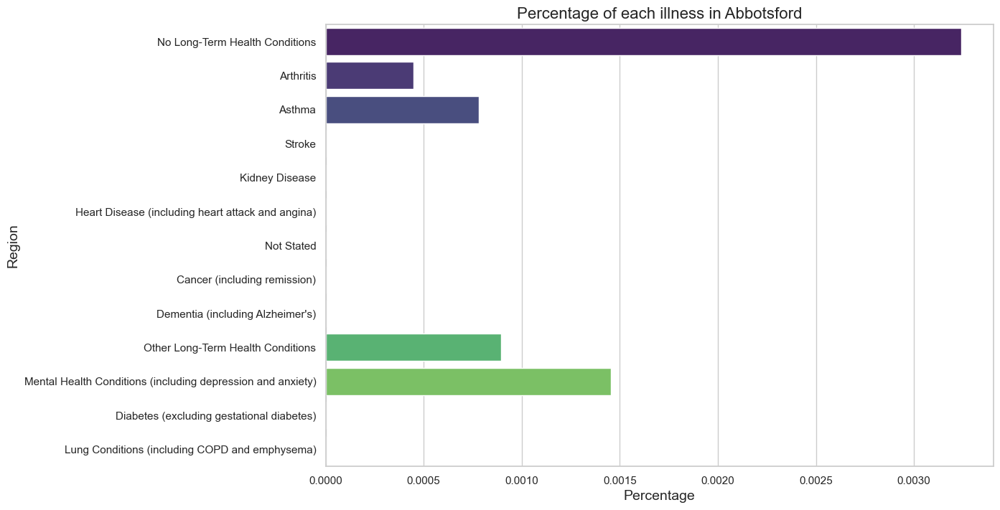

In [18]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(x="percentage", y="illness", data=df_sa2, palette="viridis")
ax.set_title(f"Percentage of each illness in {search_area}", fontsize=16)
ax.set_xlabel("Percentage", fontsize=14)
ax.set_ylabel("Region", fontsize=14)
plt.show()

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


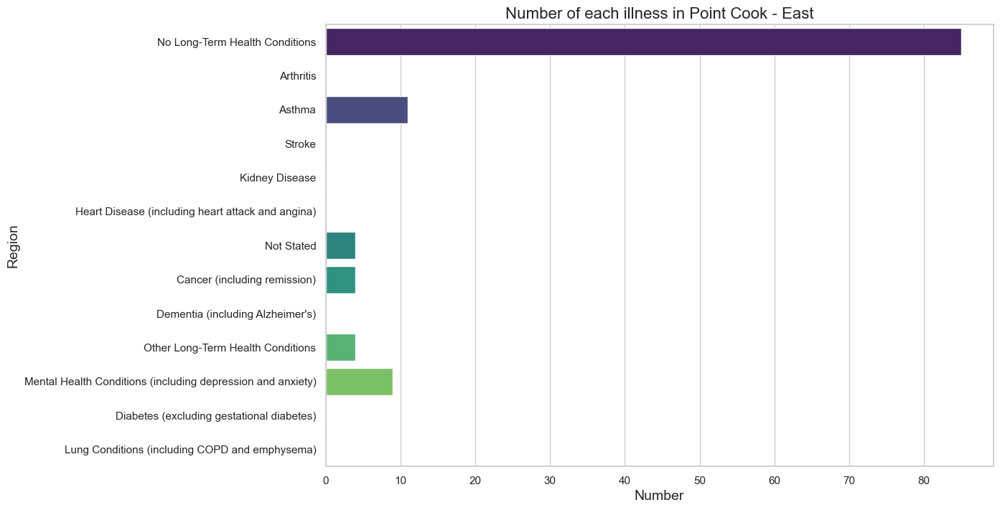

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


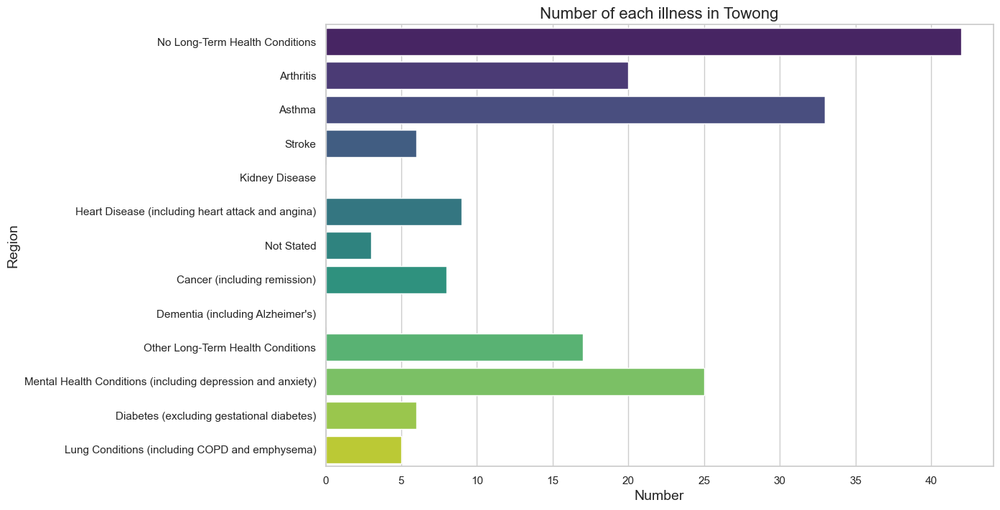

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


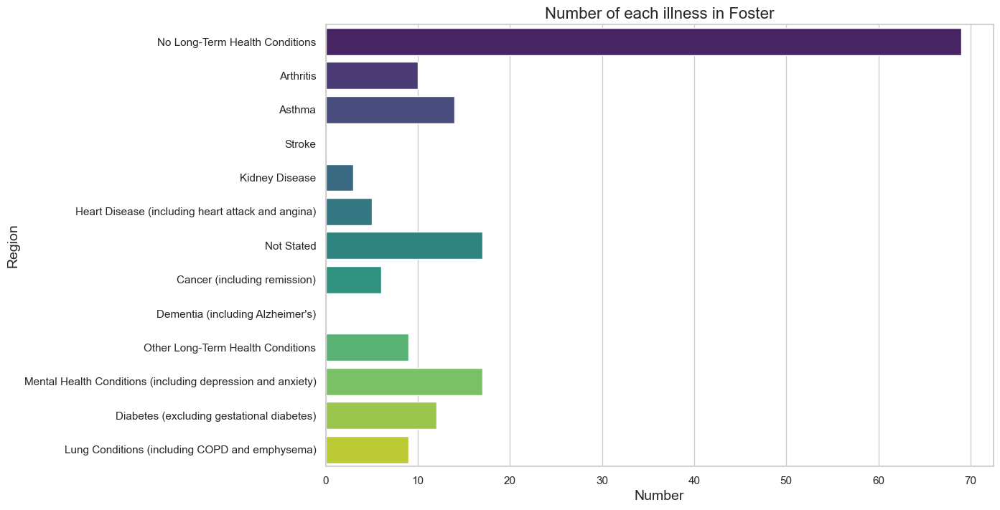

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


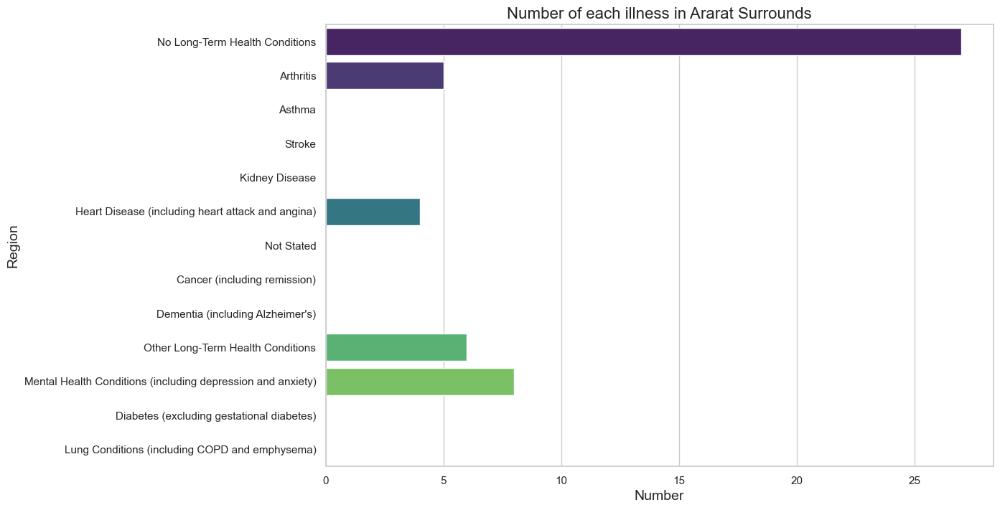

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


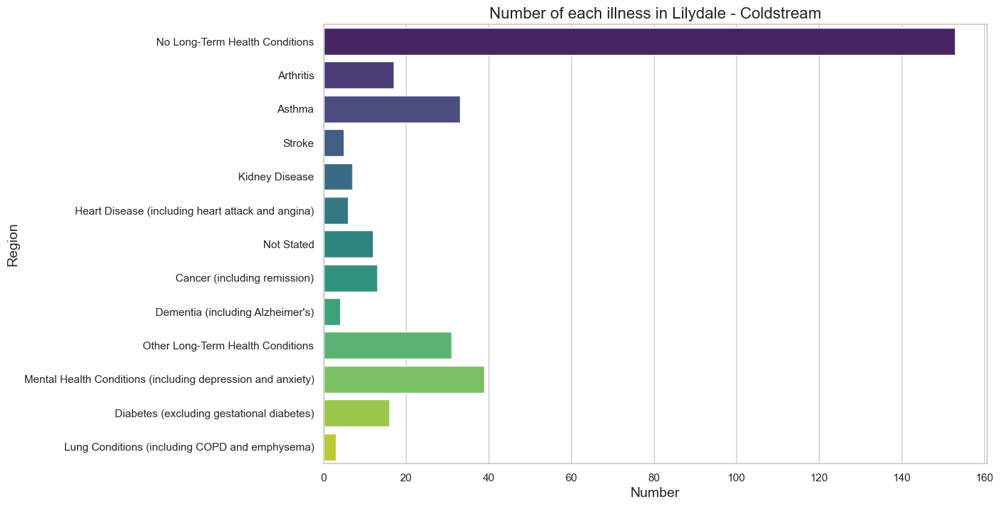

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


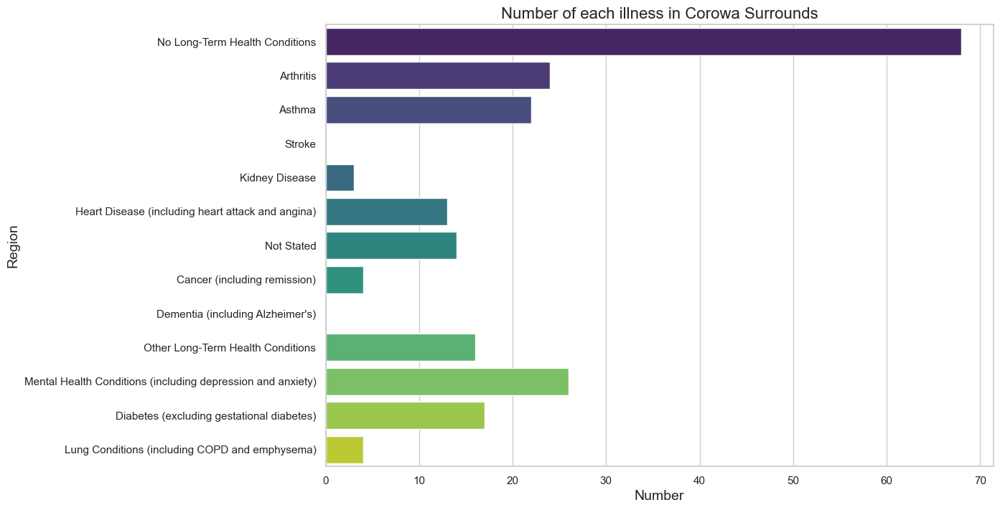

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


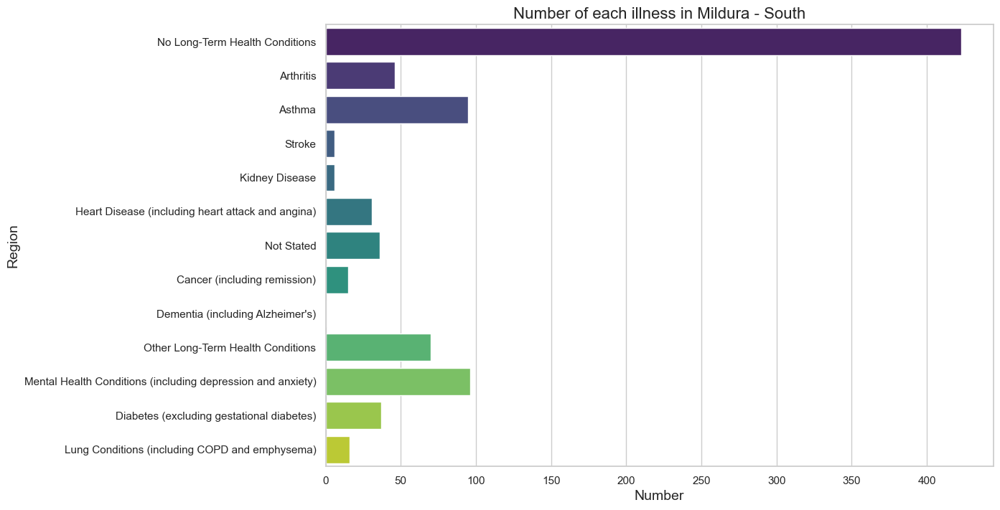

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


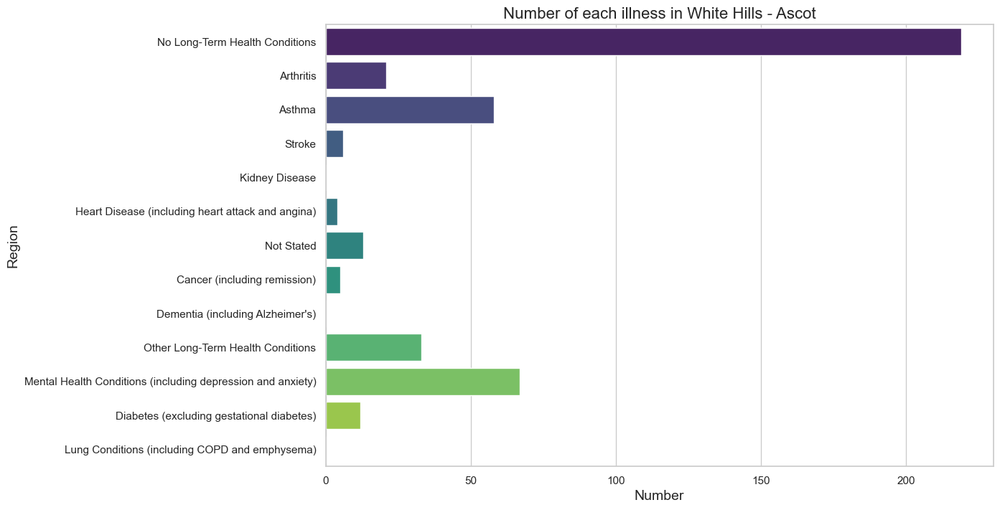

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


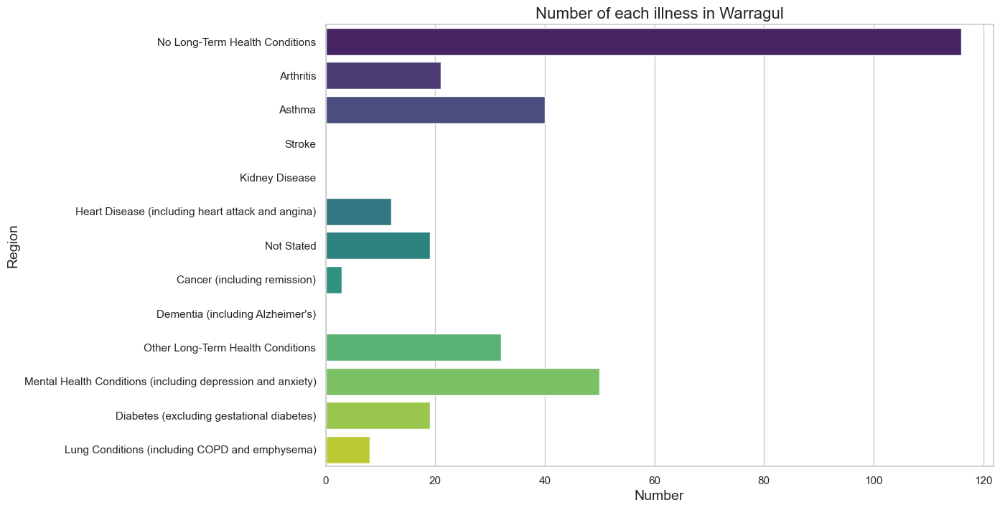

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


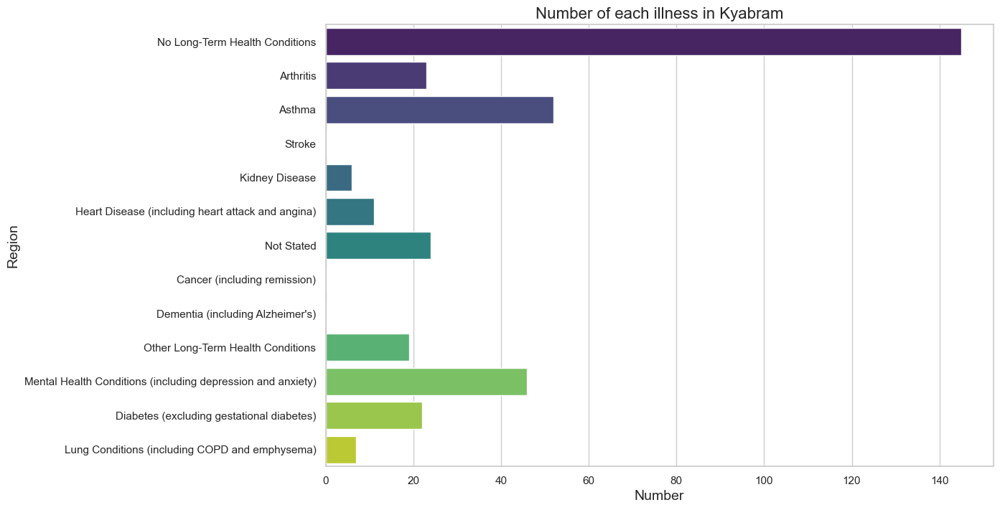

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


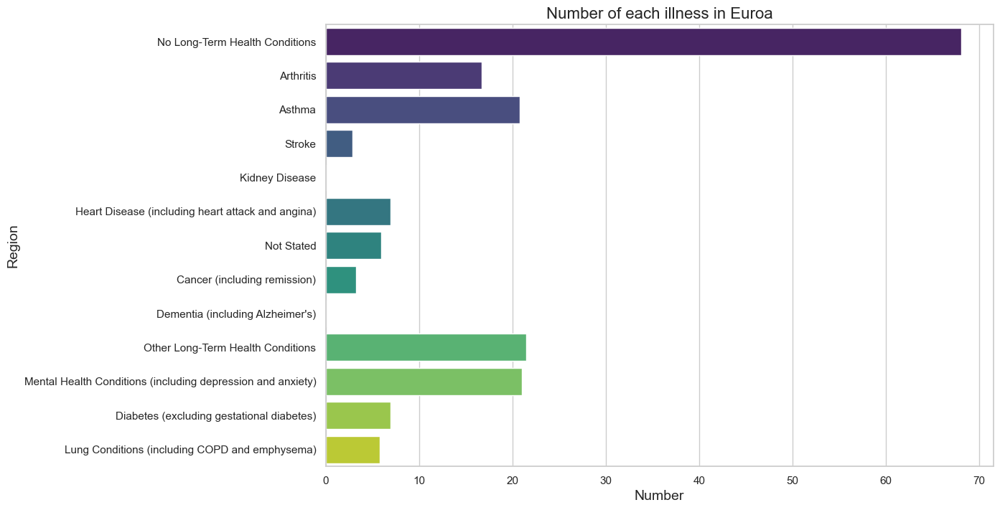

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


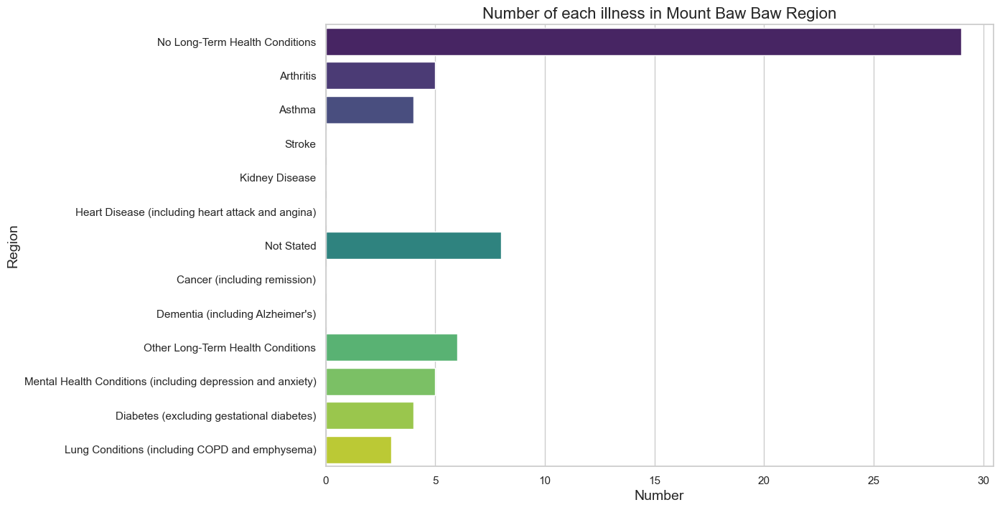

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


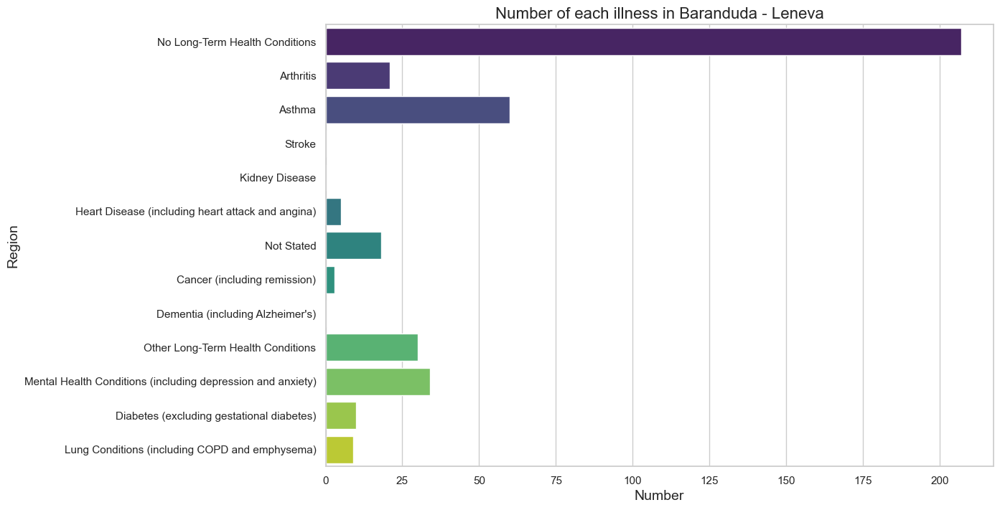

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


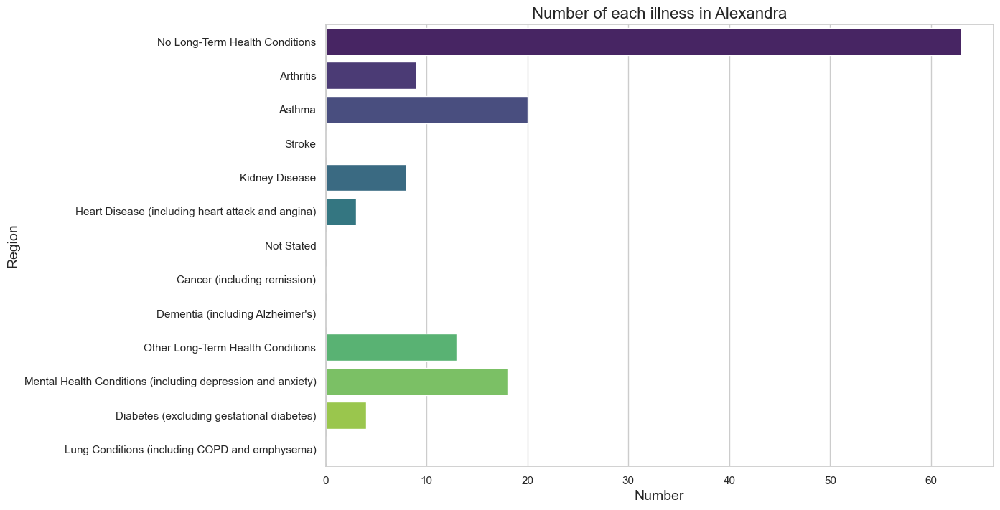

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


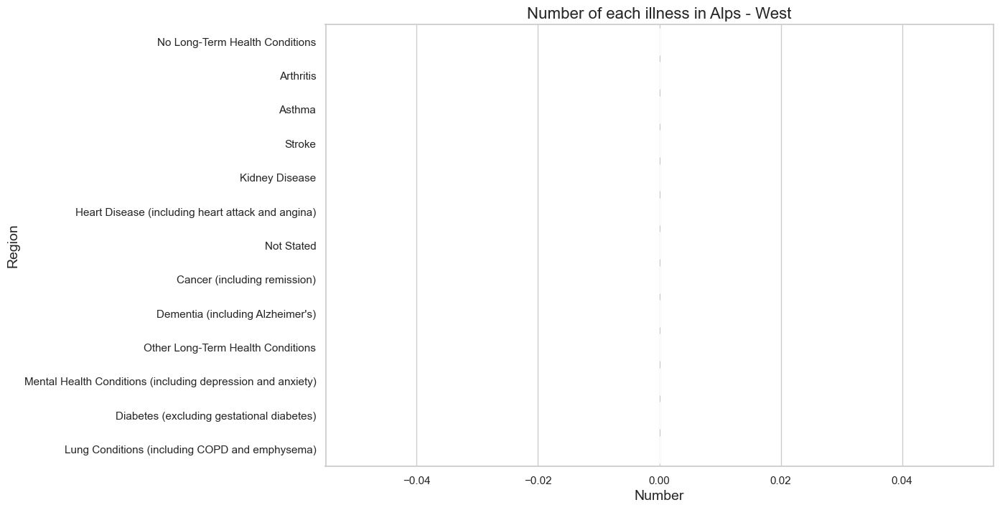

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


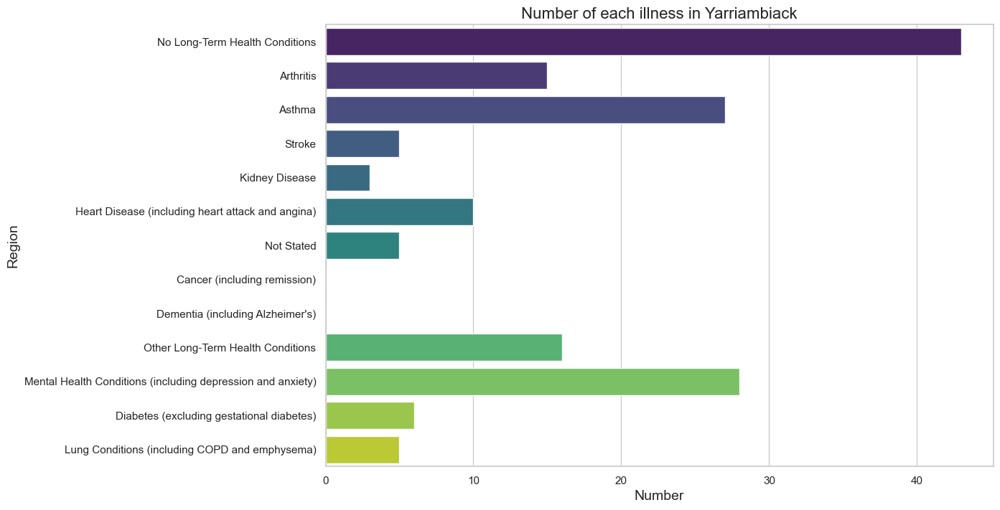

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


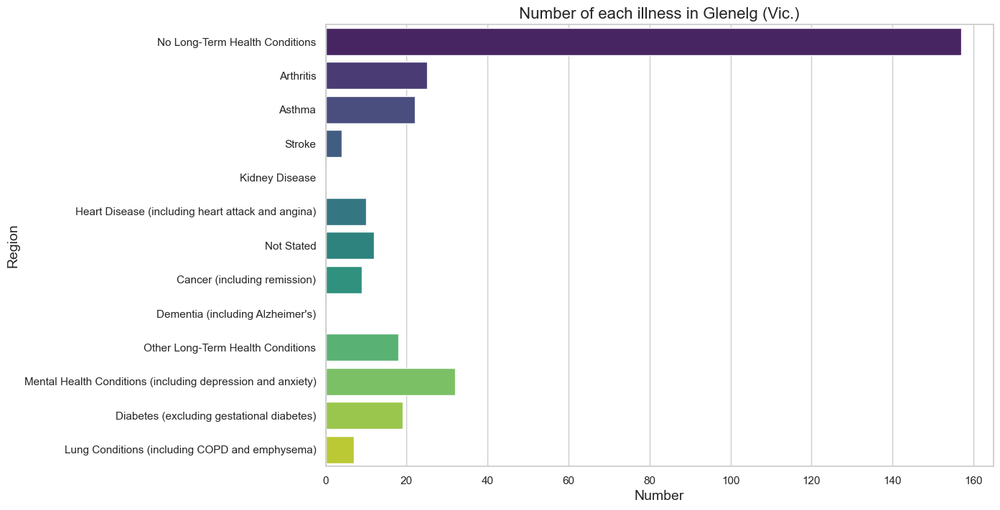

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


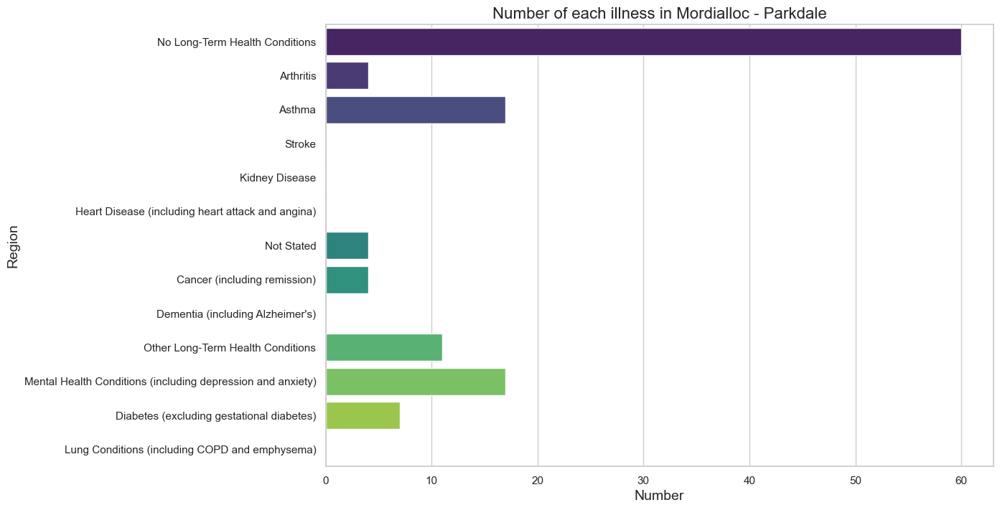

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


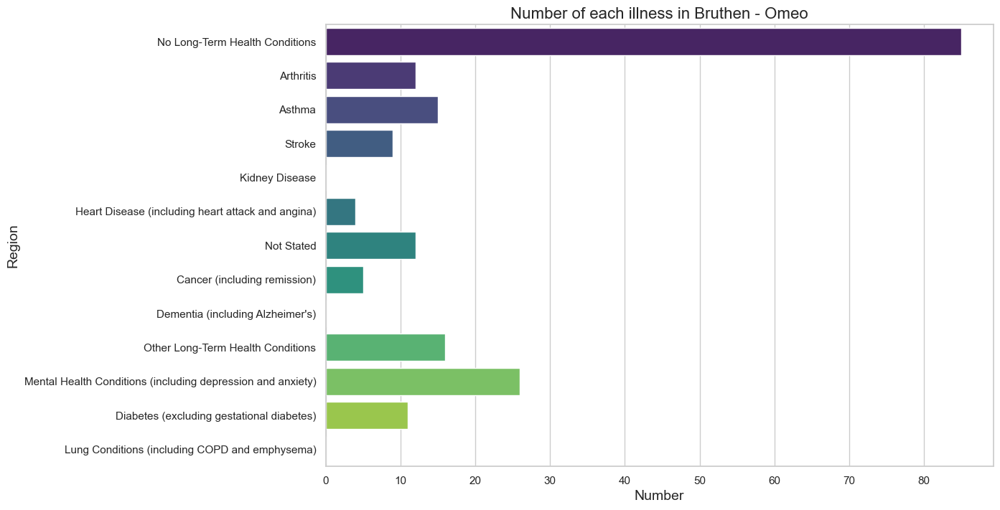

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


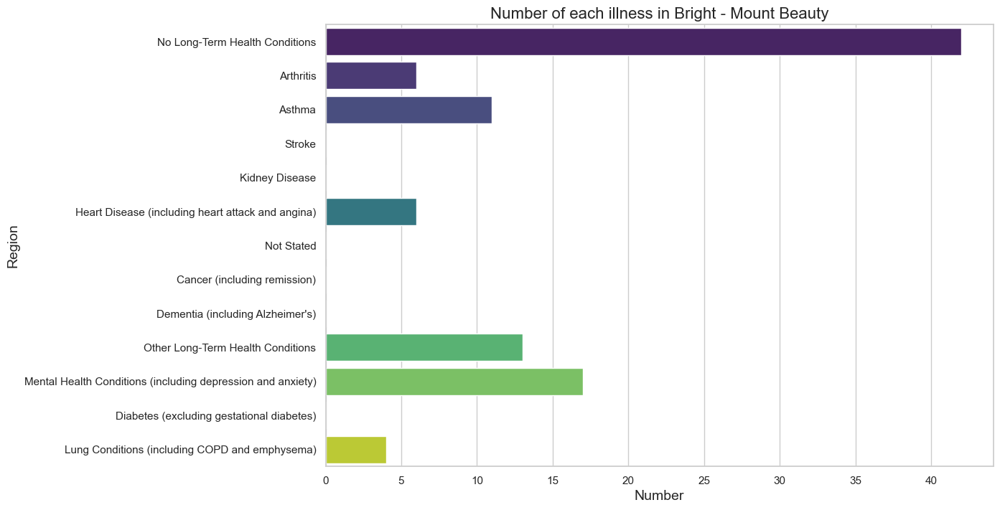

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


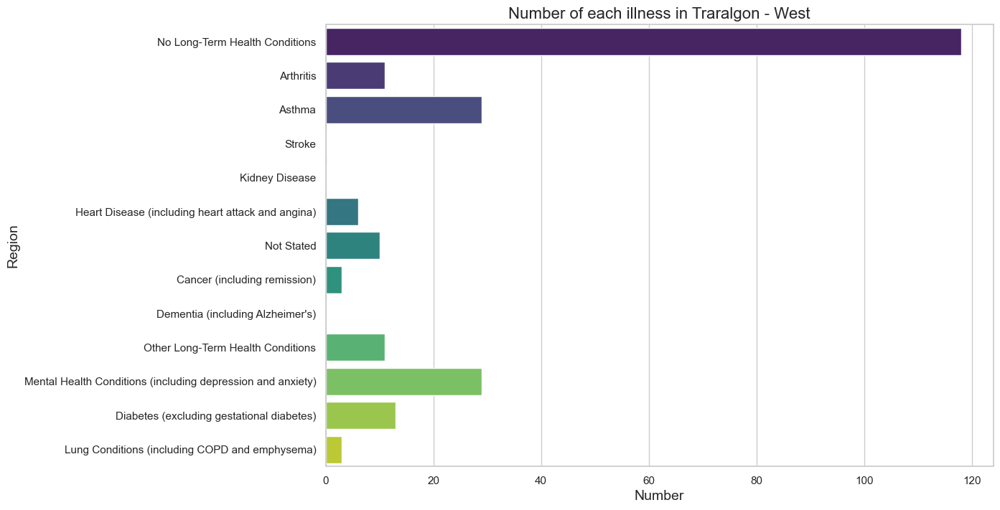

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


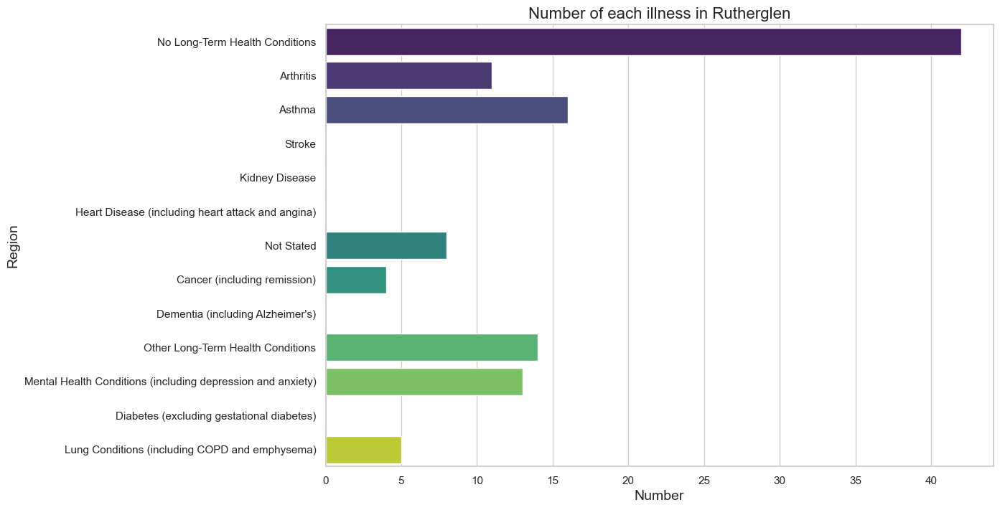

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


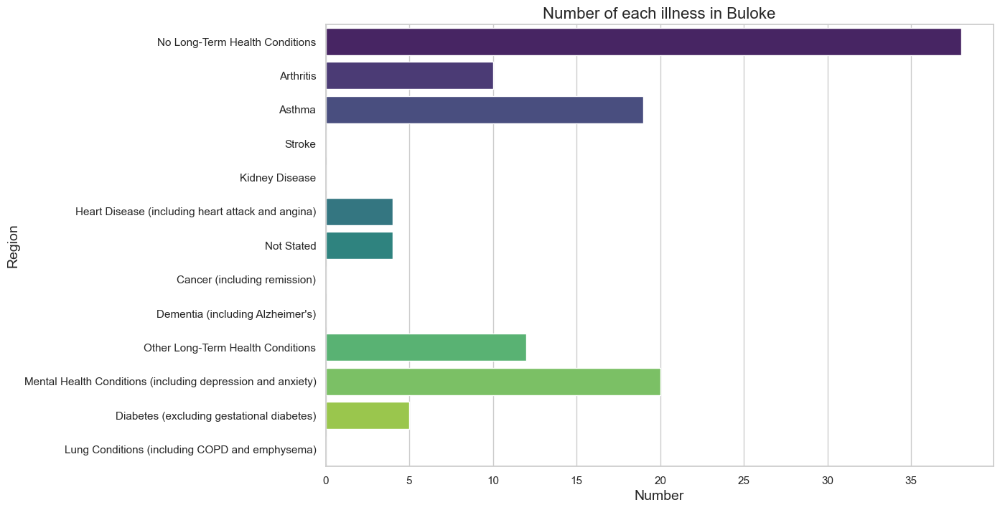

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


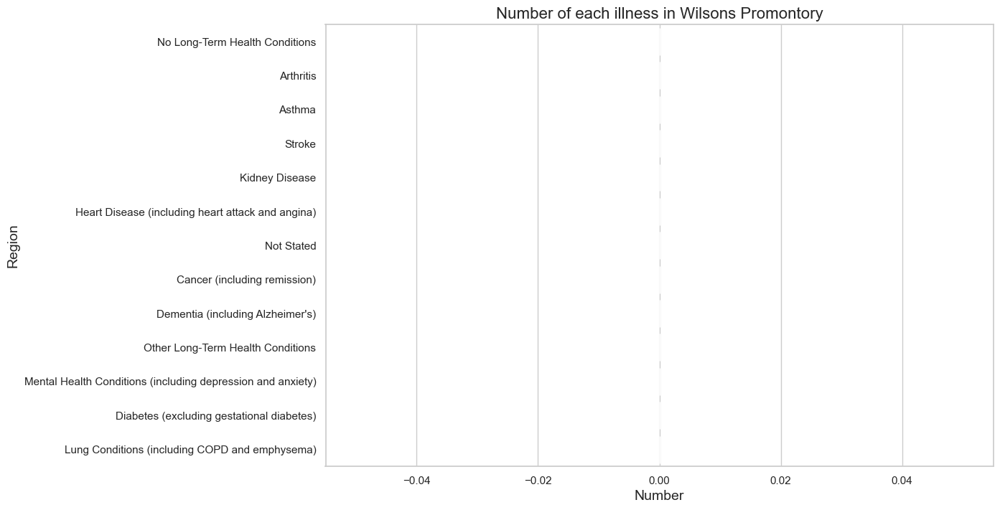

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


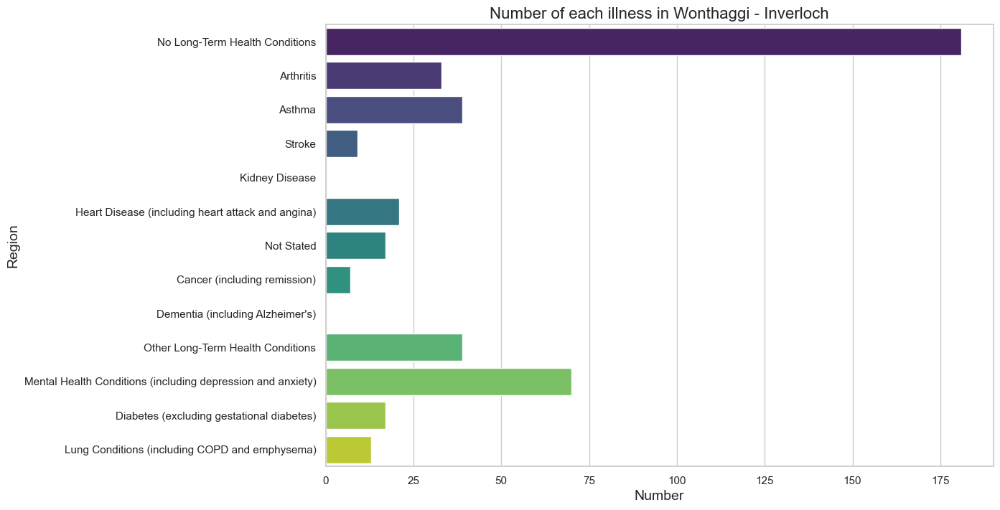

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


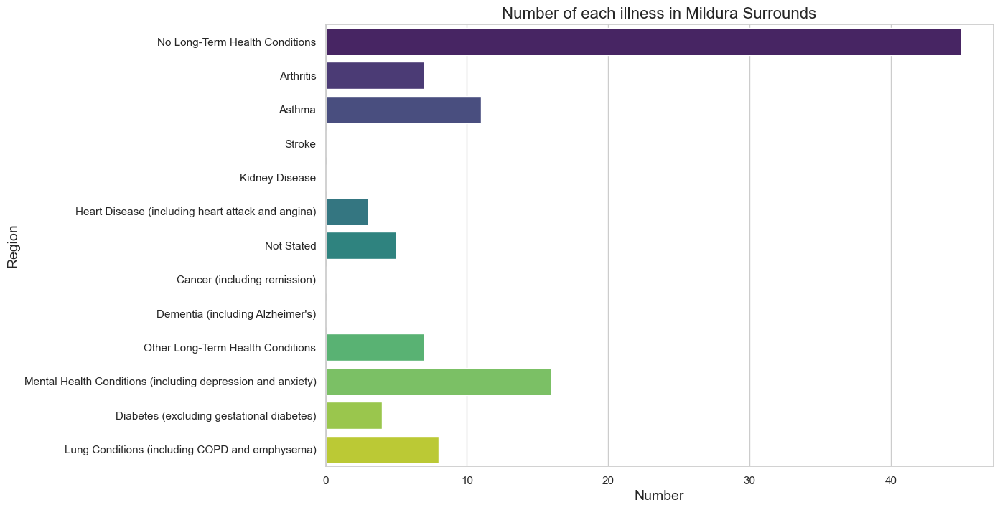

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


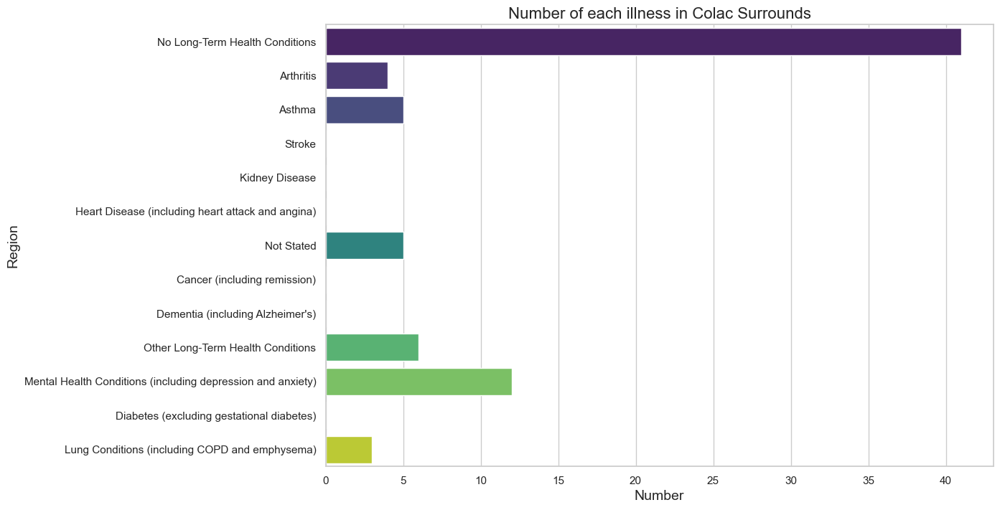

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


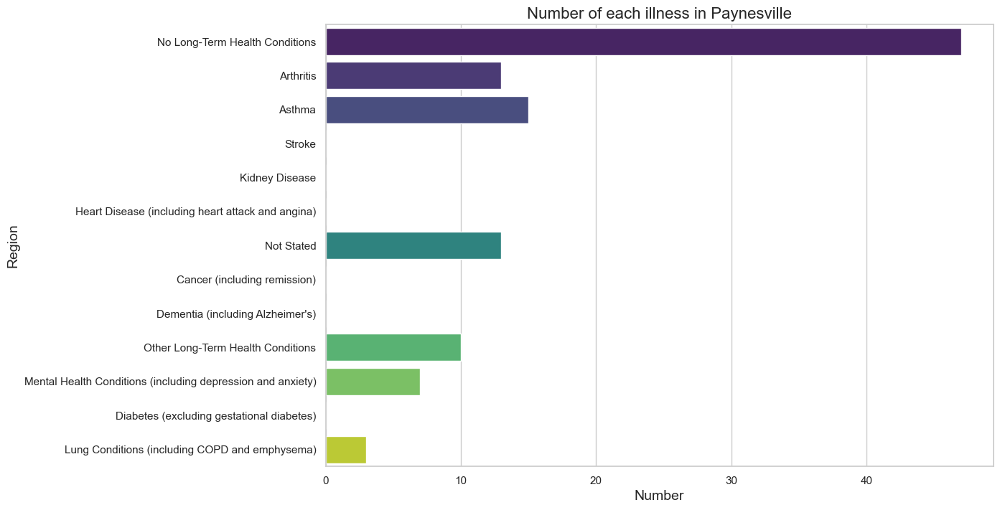

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


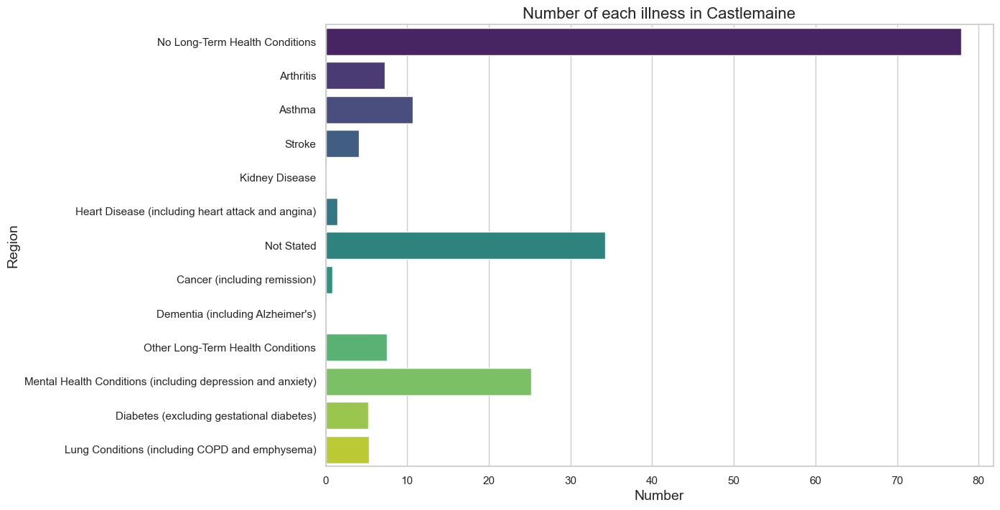

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


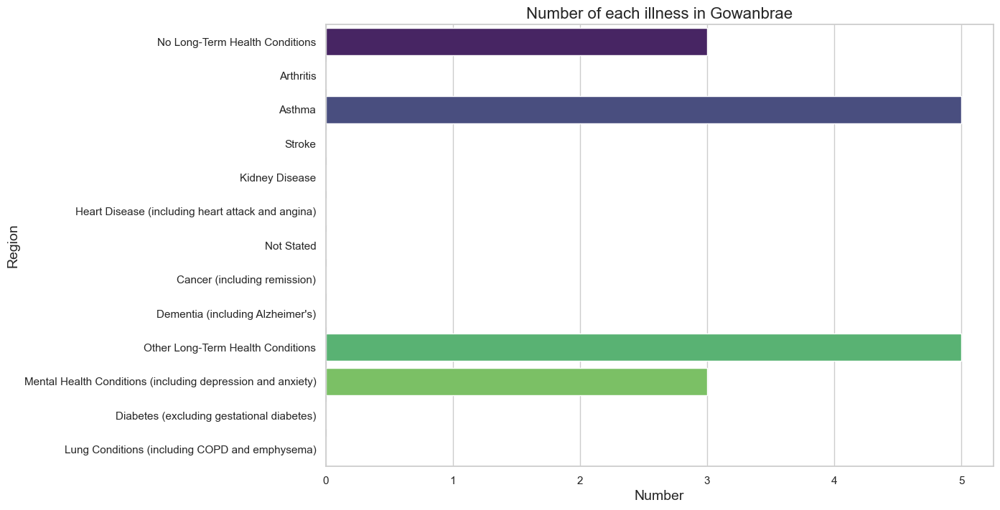

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


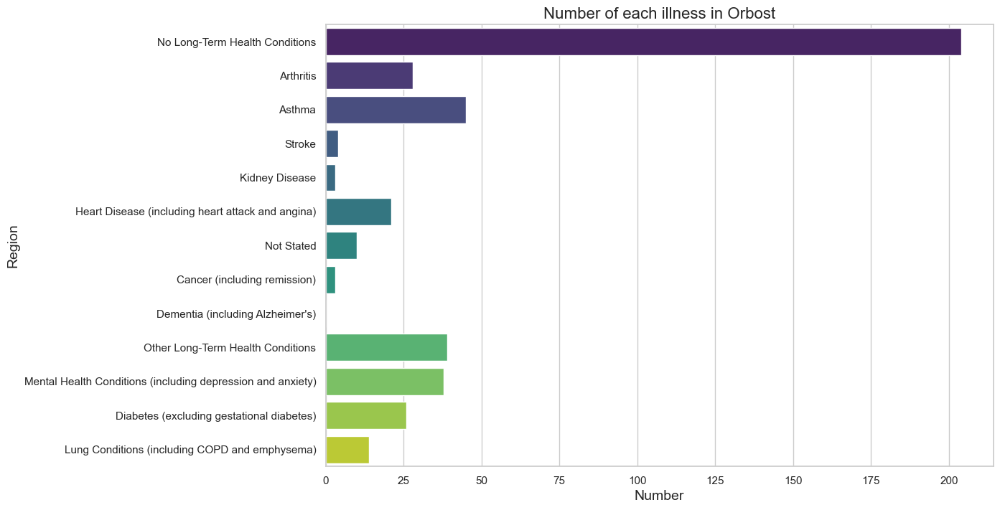

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


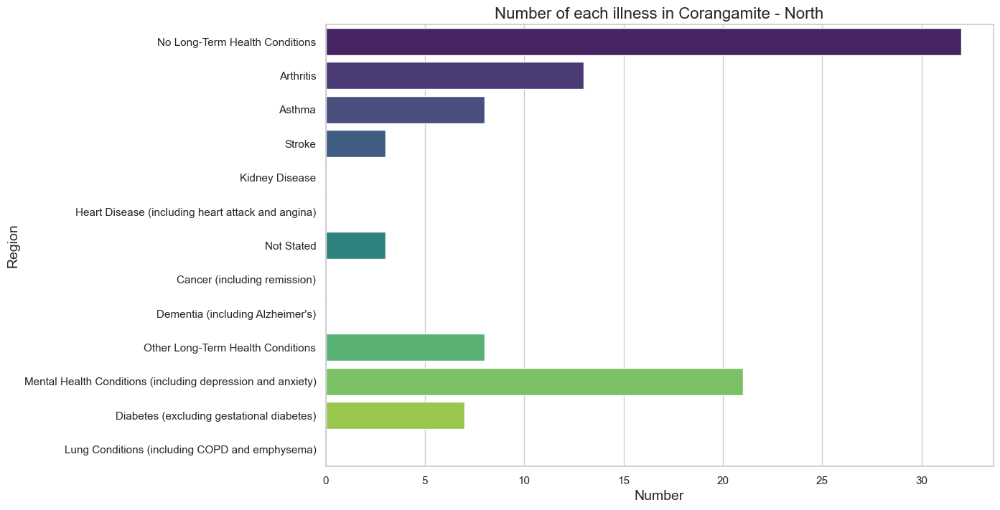

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


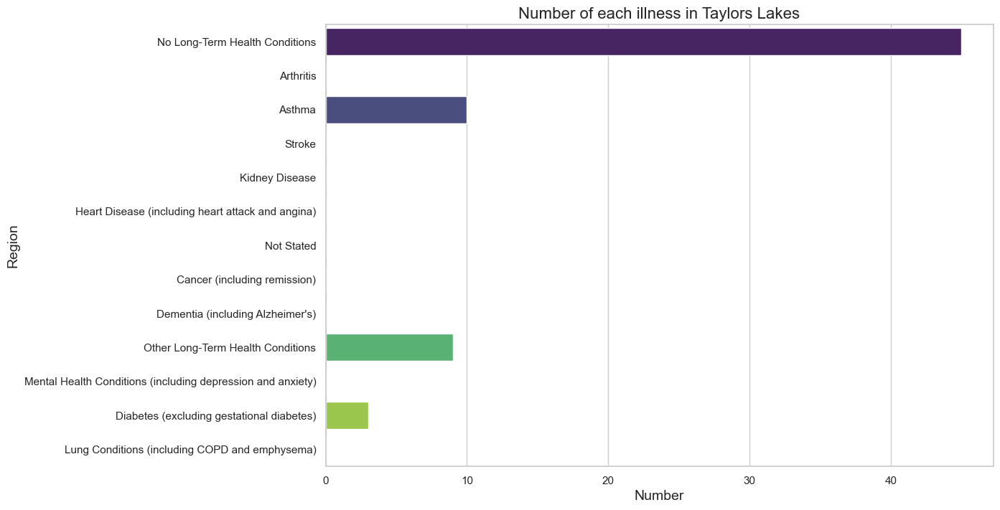

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


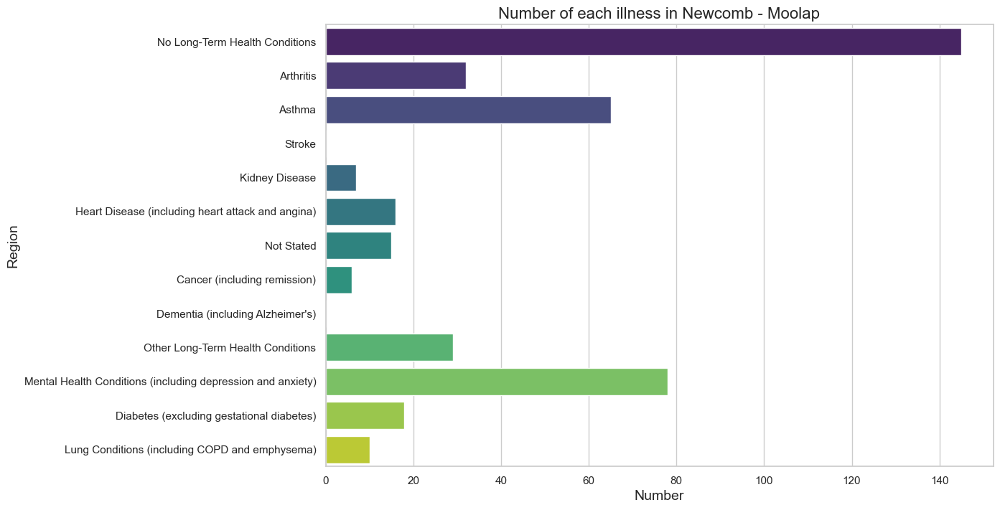

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


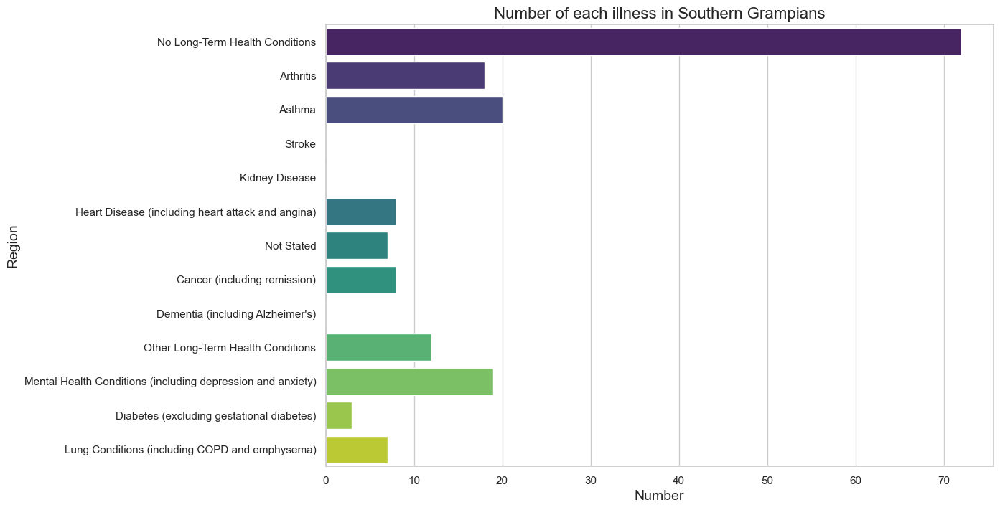

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


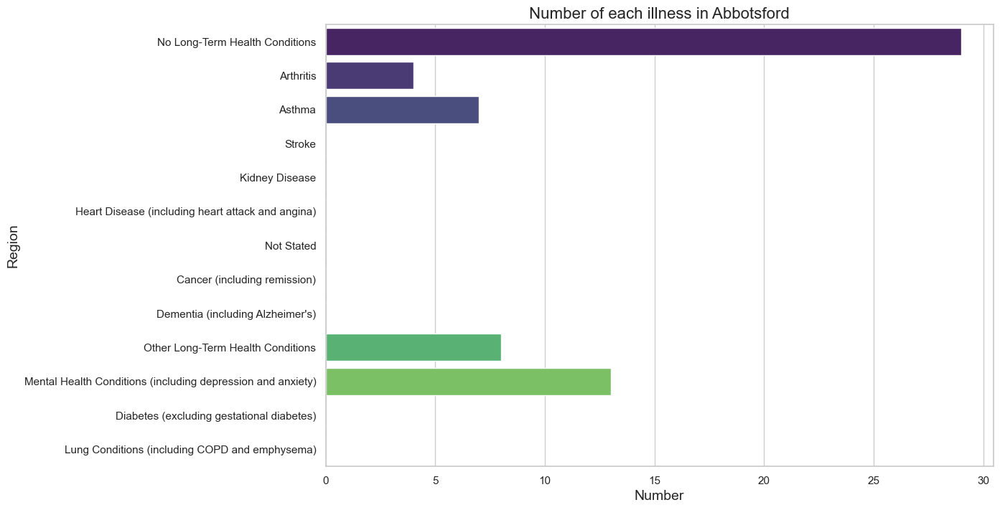

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


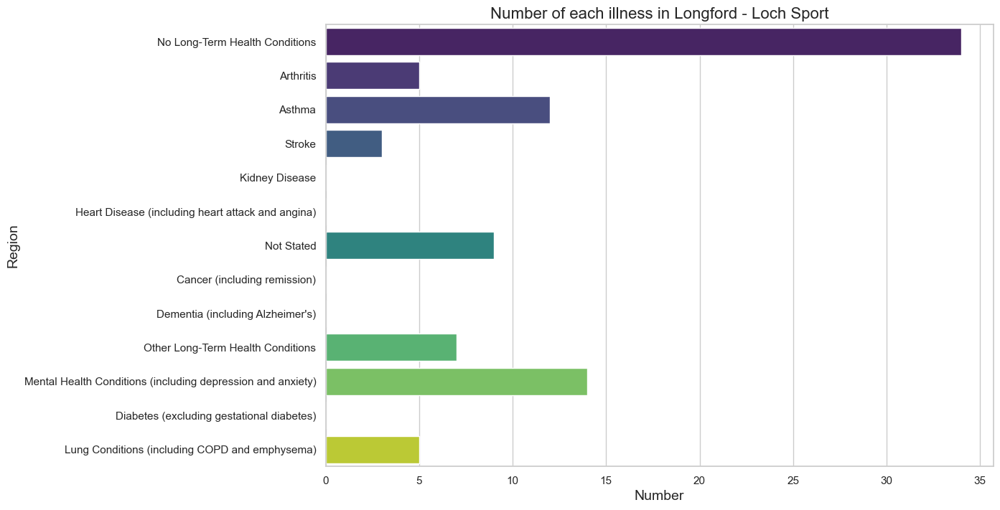

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


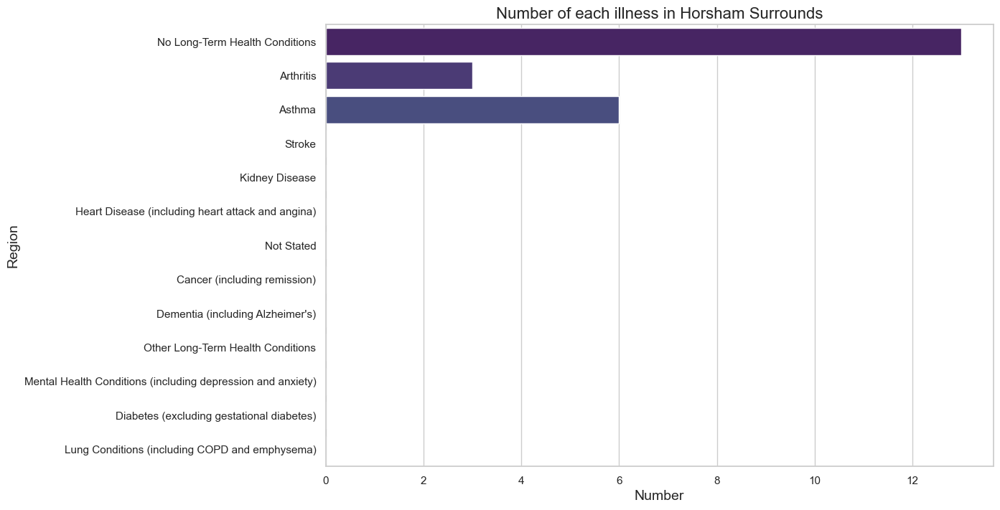

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


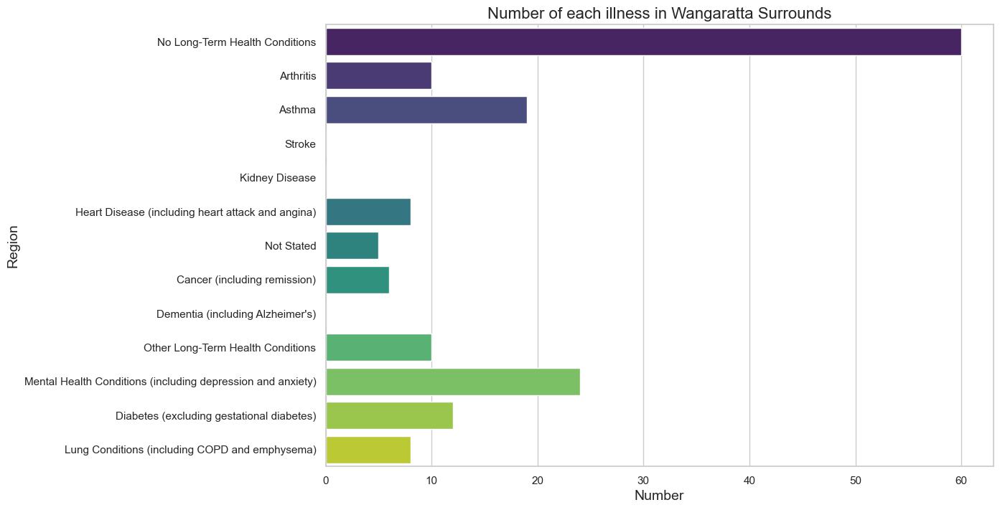

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


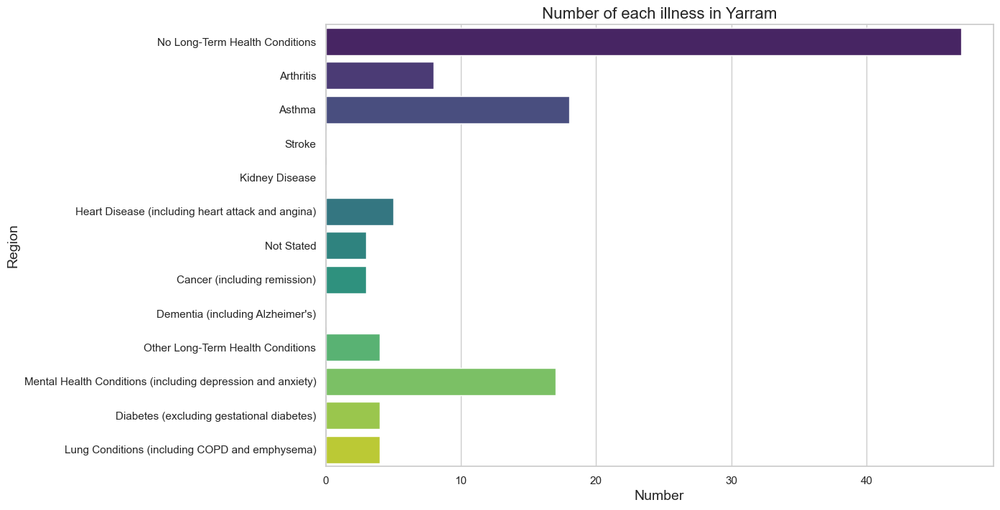

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


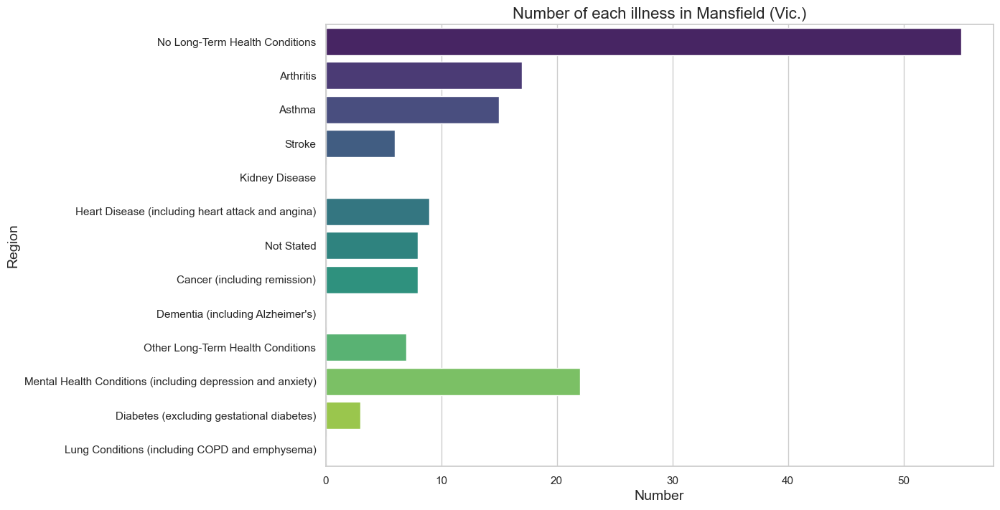

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


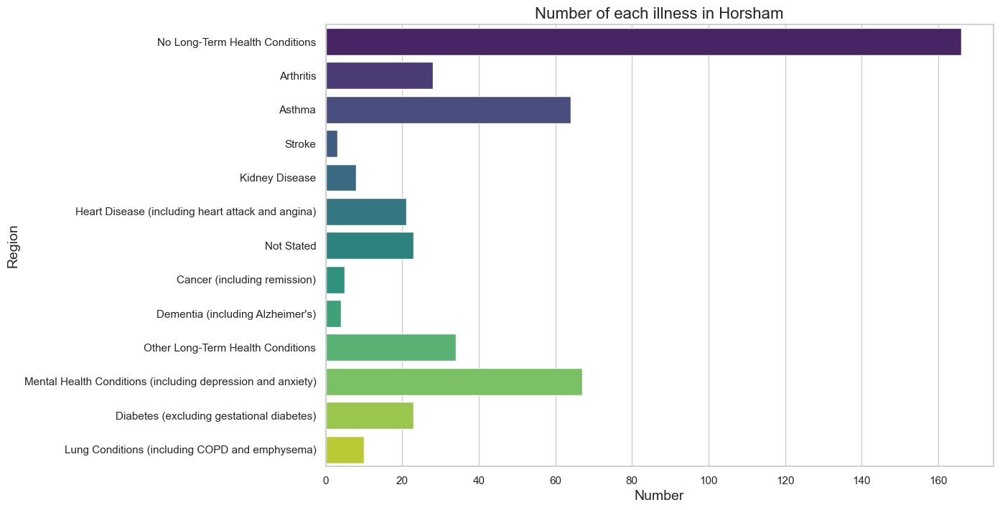

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


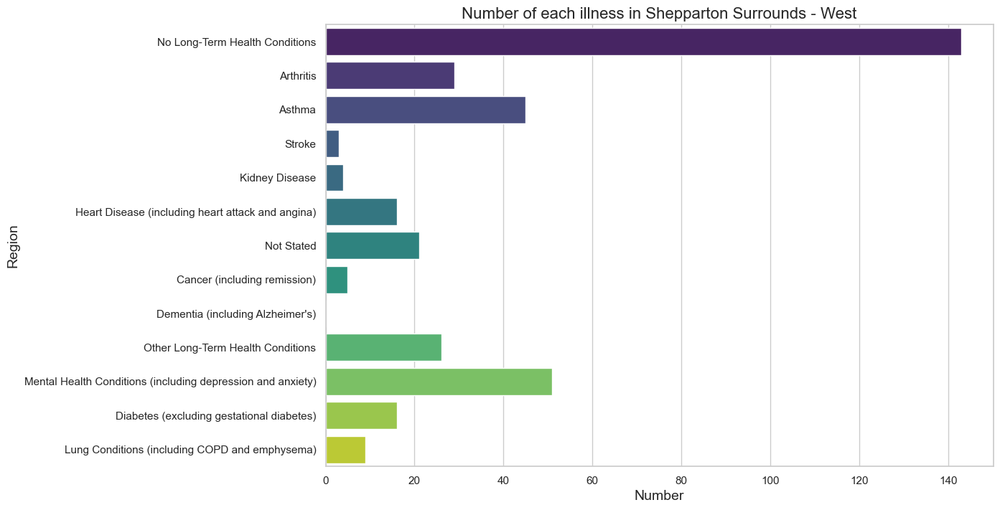

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


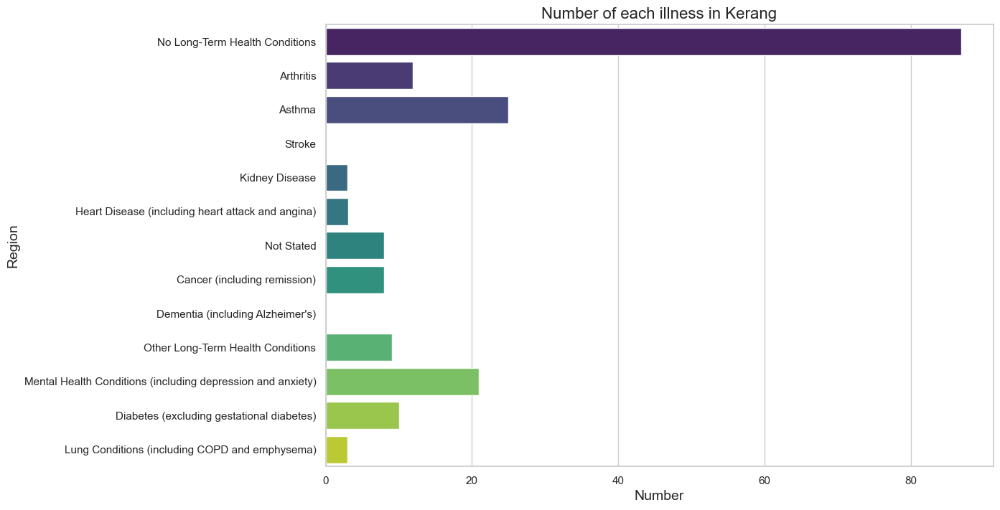

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


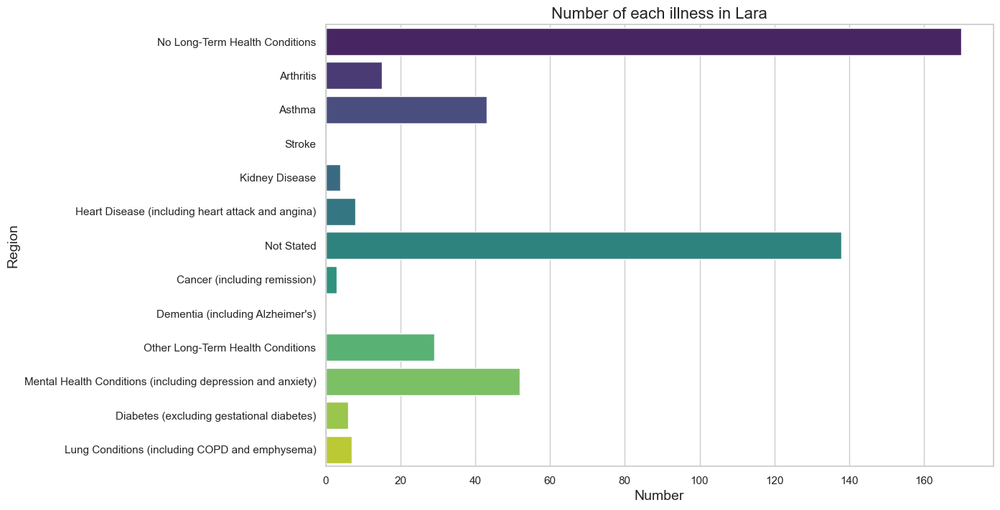

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


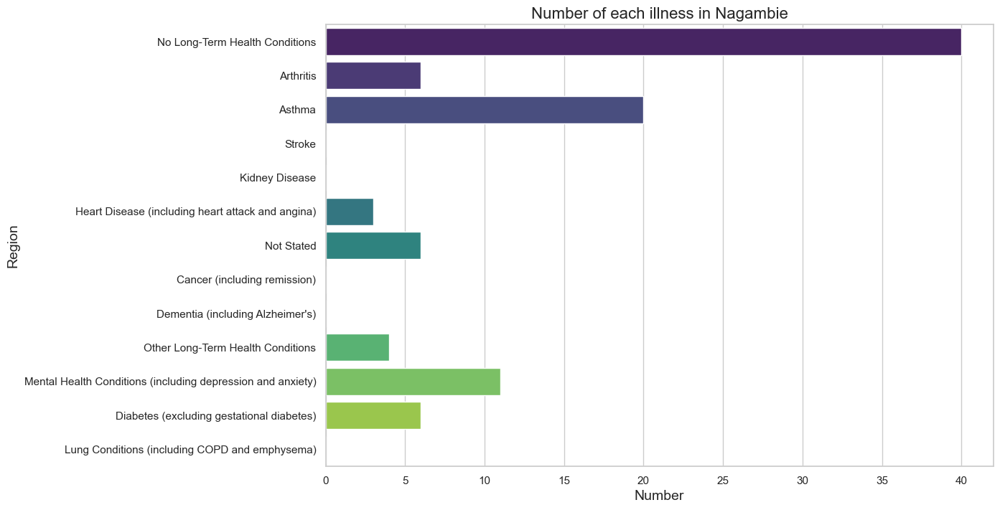

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


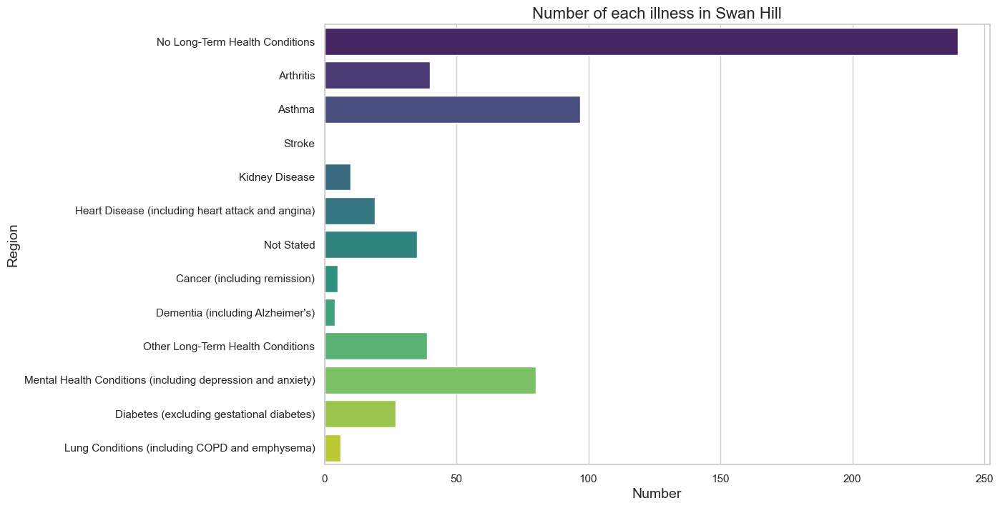

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


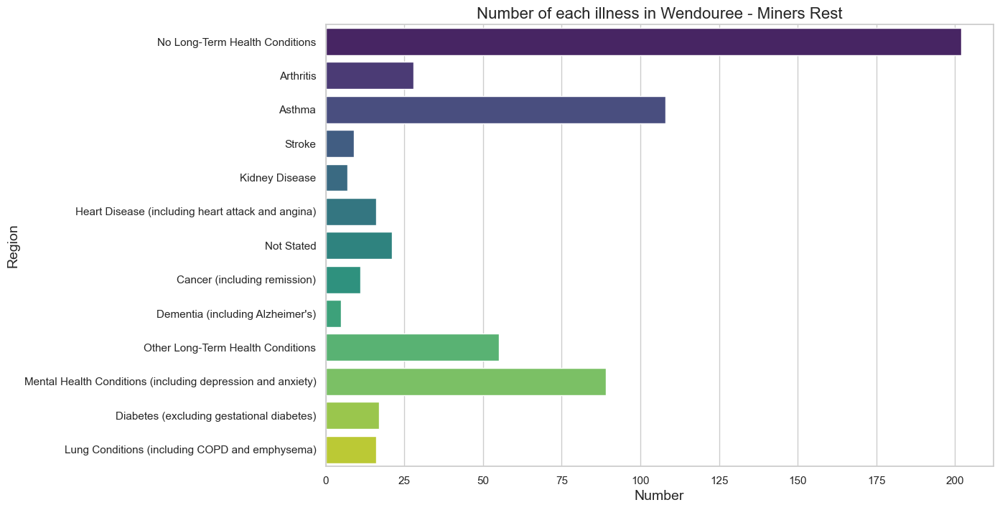

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


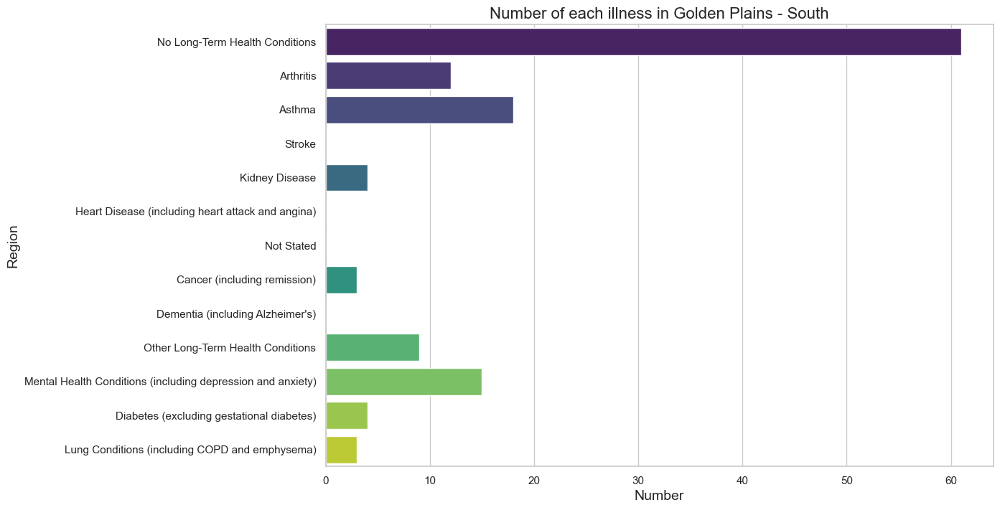

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


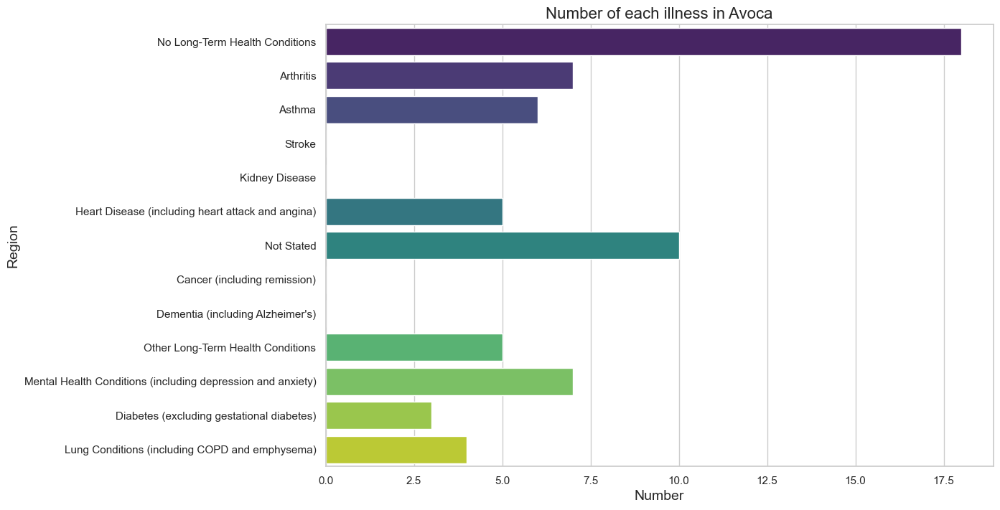

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


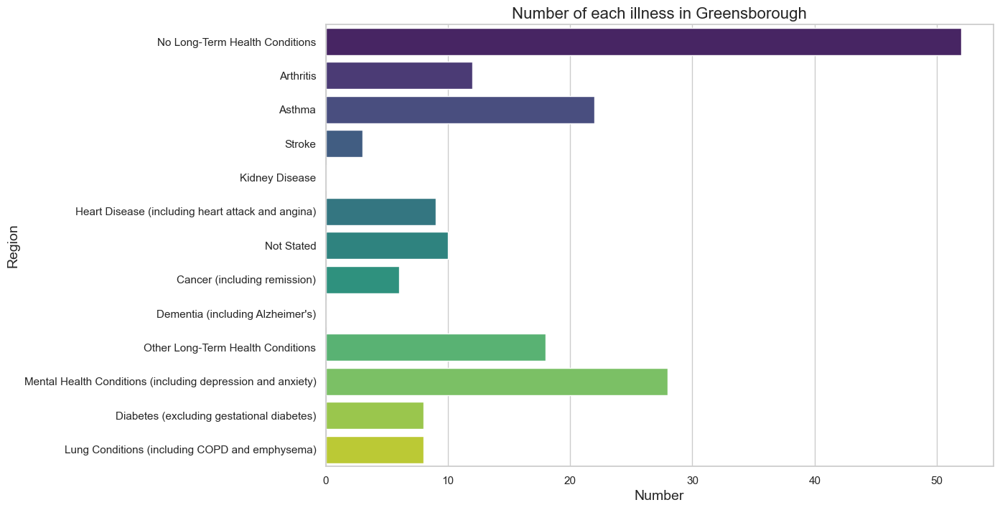

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


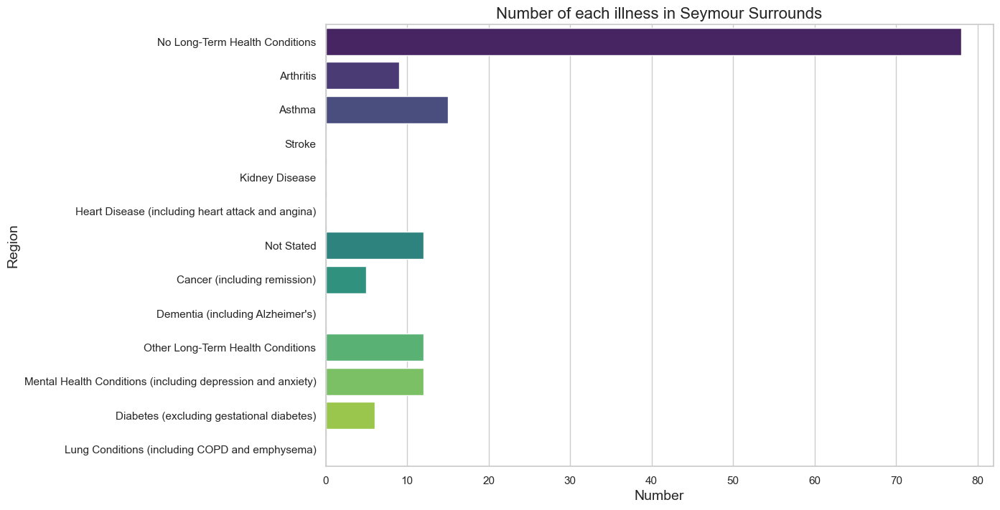

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


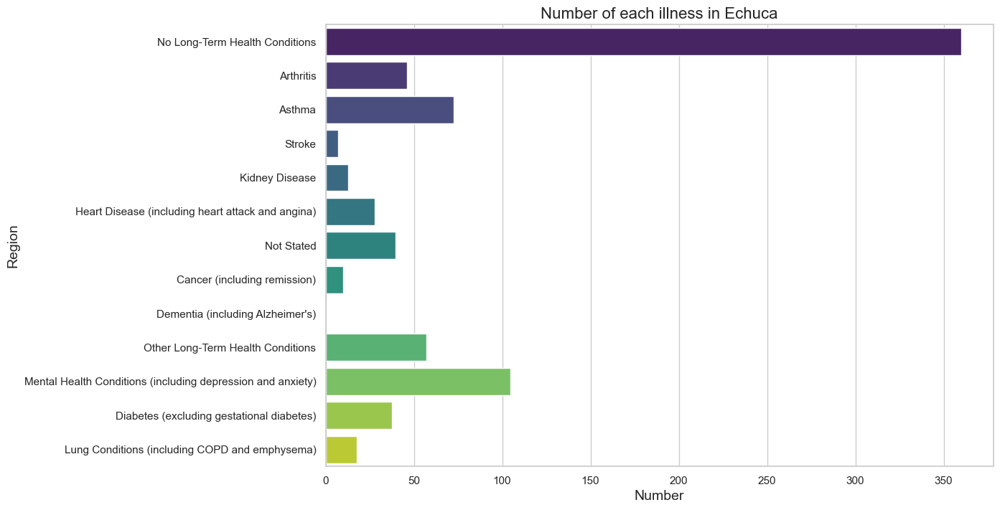

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


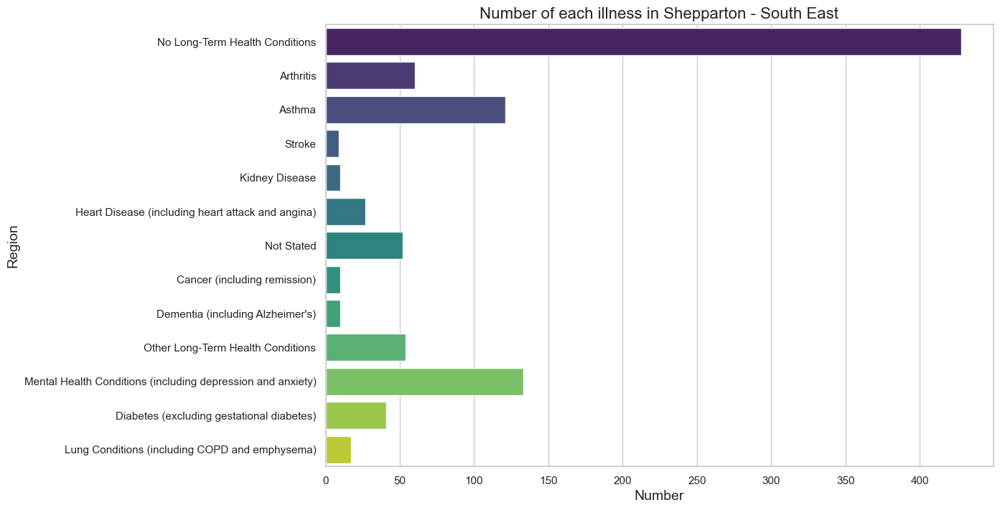

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


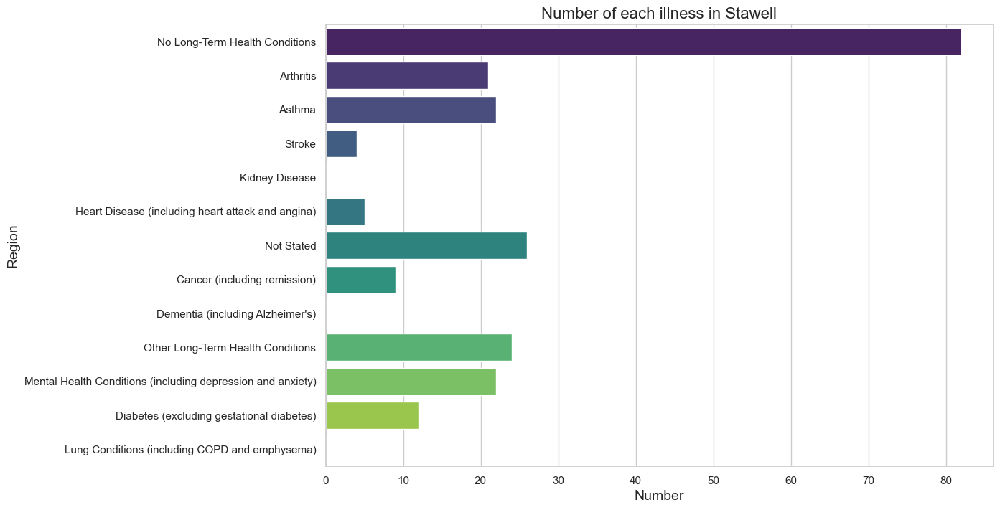

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


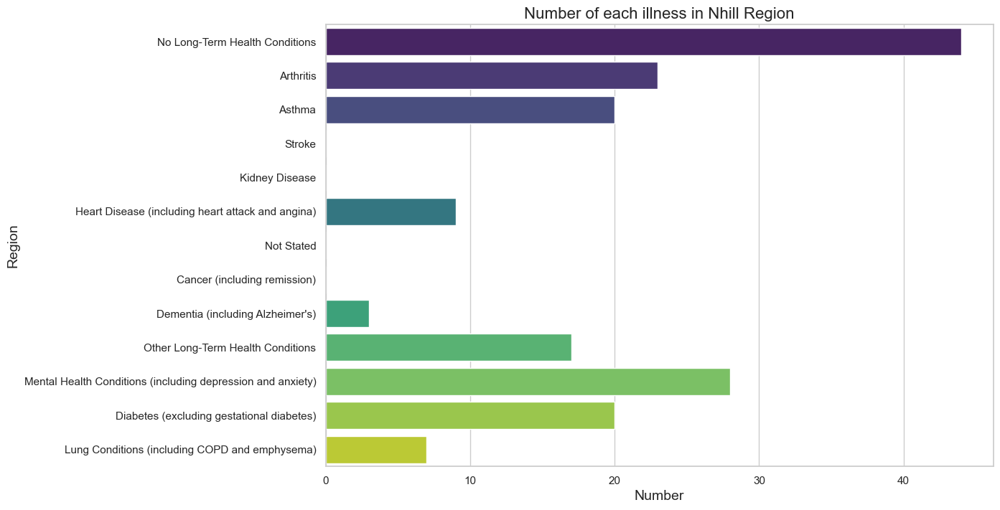

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


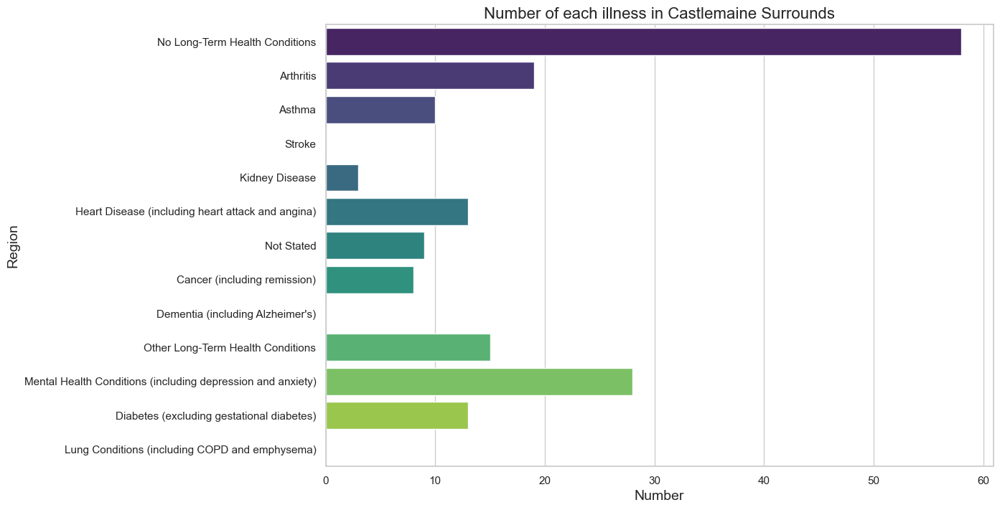

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


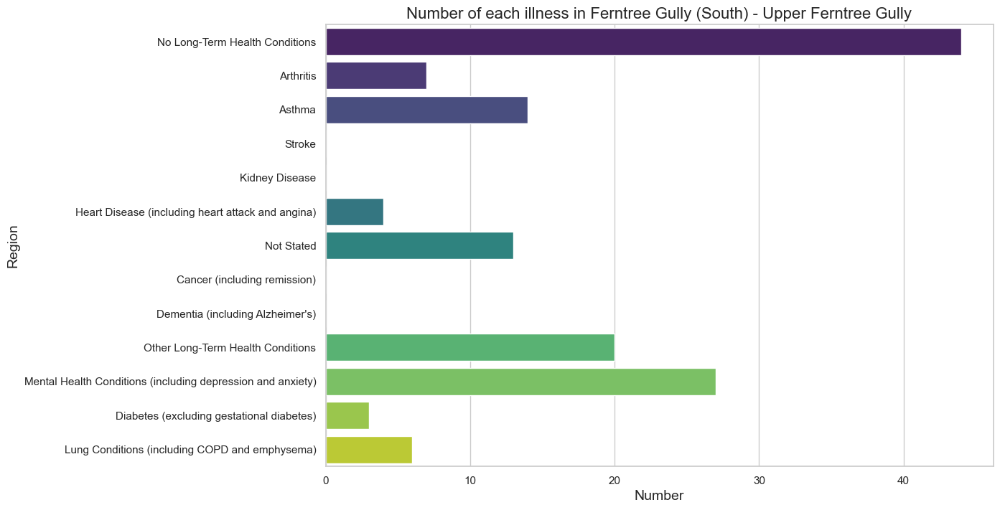

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


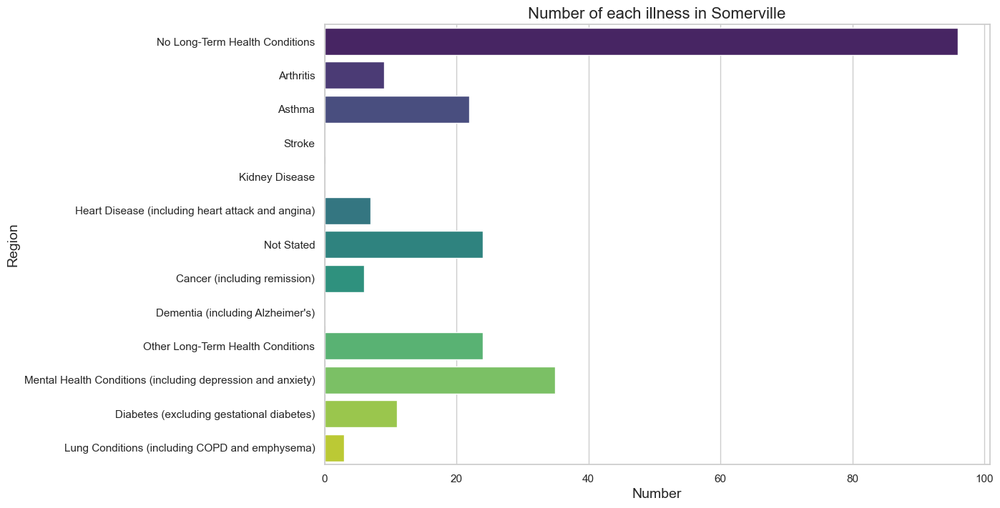

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


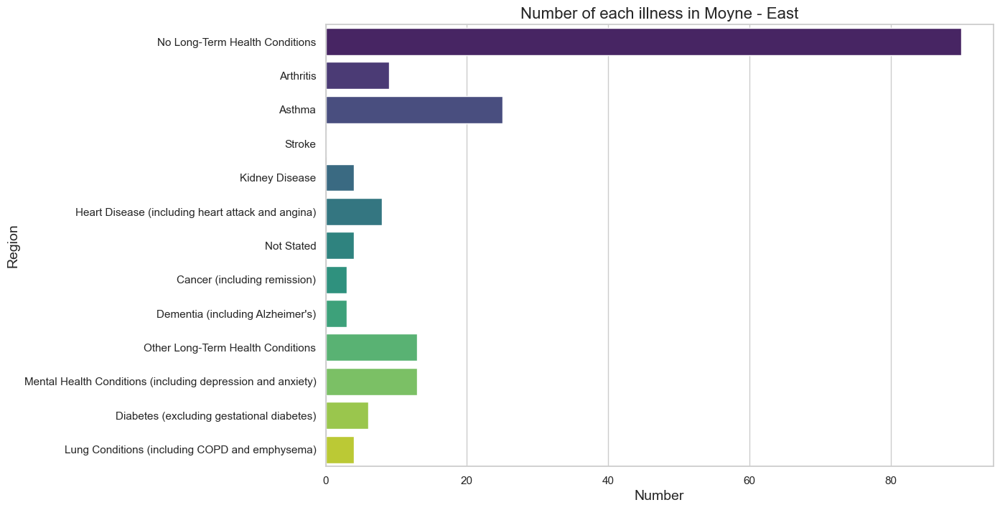

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


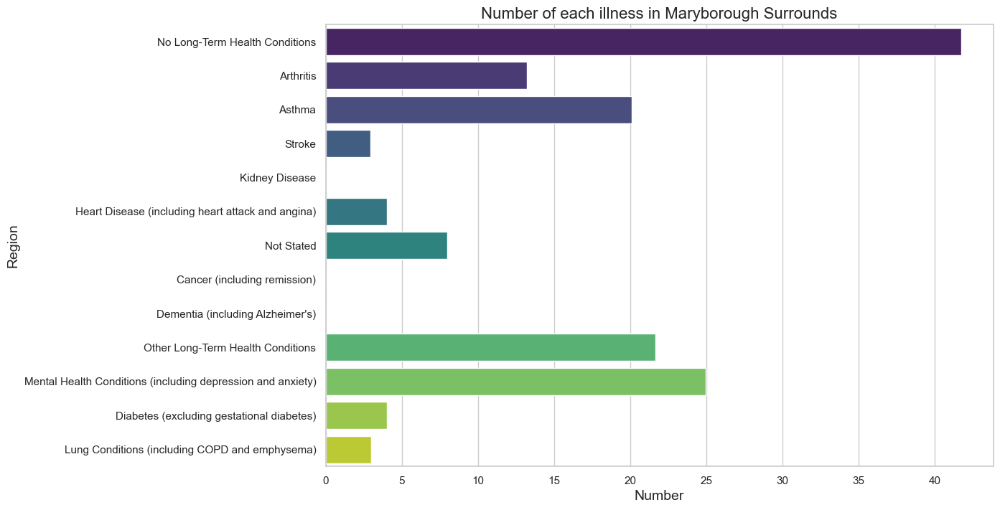

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


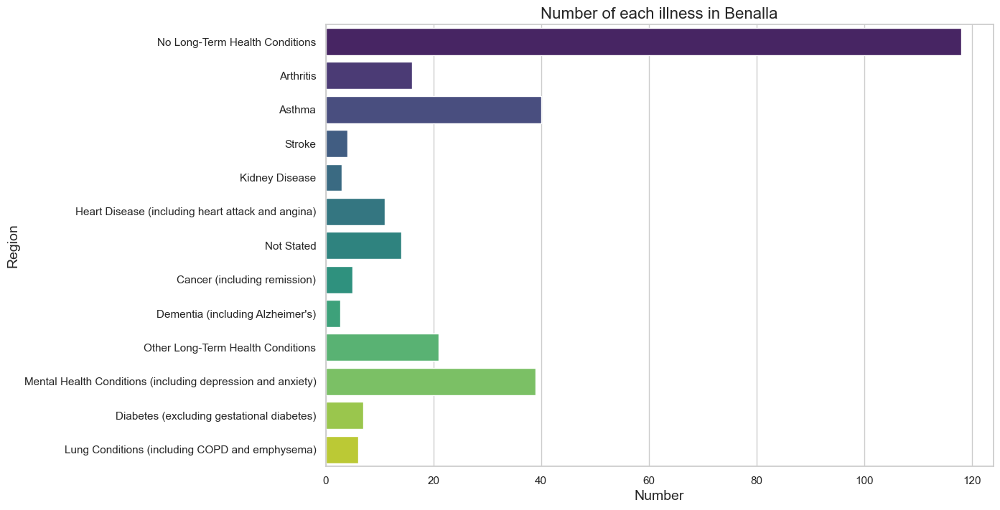

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


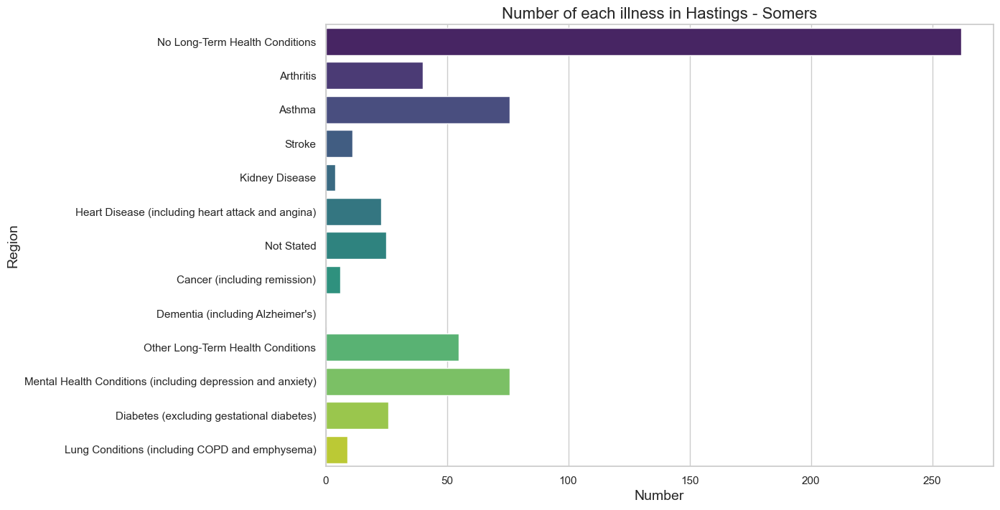

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


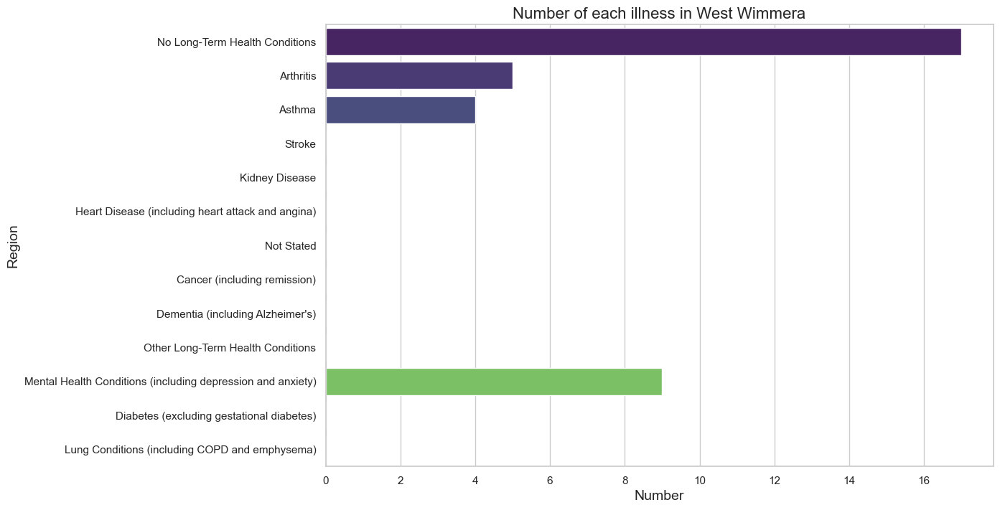

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


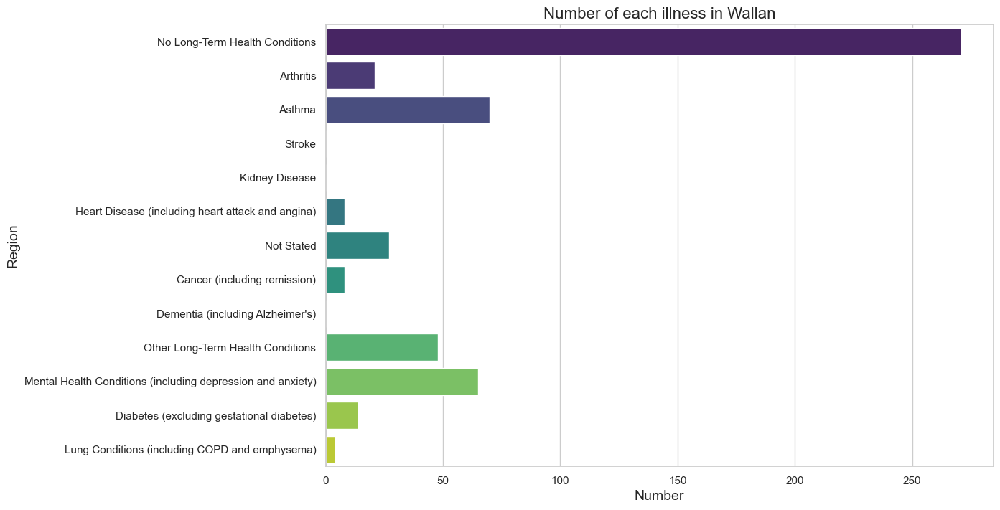

/var/folders/mw/c9434ws94jg89crtmw1fz3bm0000gn/T/ipykernel_9511/1155685915.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map)


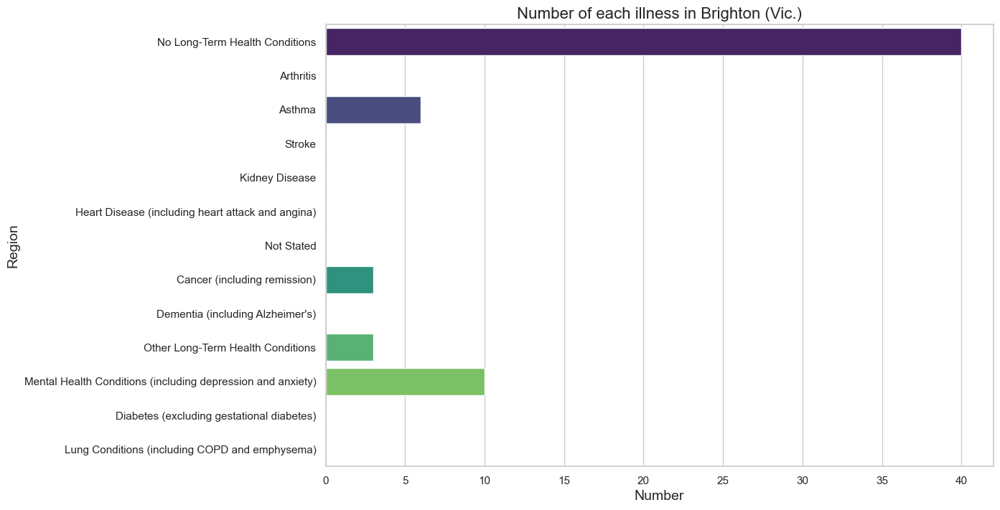

In [19]:
for area in set(df['sa2_name']):
    df_sa2 = df[df['sa2_name'] == area]
    df_sa2['illness'] = df_sa2['illness'].map(reversed_illness_map) 
    plt.figure(figsize=(12, 8))
    ax = sns.barplot(x="count", y="illness", data=df_sa2, palette="viridis")
    ax.set_title(f"Number of each illness in {area}", fontsize=16)
    ax.set_xlabel("Number", fontsize=14)
    ax.set_ylabel("Region", fontsize=14)
    plt.show() 